# Faraday Dreams Real Data Example assuming postive and negative $\lambda^2$ for solution

Then recovery is performed using Faraday Dreams + Optimus Primal on real data.

In [1]:
import sys
sys.path.insert(0,'..')
#put path to optimusprimal git repo
sys.path.insert(0,'../../Optimus-Primal')
import optimusprimal.prox_operators as prox_operators
import optimusprimal.linear_operators as linear_operators
import optimusprimal.primal_dual as primal_dual
import faradaydreams.measurement_operator as measurement_operator
import faradaydreams.models as models
import faradaydreams.convex_solvers as solvers
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table

Reads the data and sets up the observation

In [2]:
#data from http://vizier.u-strasbg.fr/viz-bin/VizieR-3?-source=J/ApJ/825/59/table6
table_data = Table.read("../data/anderson_rms.vot")
sources = np.array(np.unique(table_data['ID']))
def get_data(source, table_data, sigma_factor):
    data = table_data[table_data['ID']==source]
    y =  np.array(data['Q'] + 1j * data['U'])
    stokes_I = np.array(data['I'])
    print(len(stokes_I))
    weights_q = np.array(data['e_Q'])
    weights_u = np.array(data['e_U'])
    sigma = np.std(np.abs(weights_q + 1j * weights_u)) 
    sigma = sig_factor * sigma
    c = 299792458.0 #speed of light m/s
    m_size = len(y) #numbr of channels
    freq0 = np.real(data["nu"]) * 10**9  # frequency coverage
    dfreq = np.abs(20 * 10**6) # channel width
    lambda2 = (c/freq0)**2 #wavelength^2 coverage
    lambda1 = np.sqrt(lambda2) # wavelength coverage
    dlambda2 = (c/(freq0 - dfreq/2.))**2 - (c/(freq0 + dfreq/2.))**2 #channel width in wavelength squared.
    phi_max, phi_min, dphi = measurement_operator.phi_parameters(lambda2, dlambda2) #sensitivity estiamtes given coverage
    phi_max = 2000
    phi_min = -2000
    dphi = 40
    phi = np.arange(phi_min,phi_max, dphi/2., dtype=float) # range in rad/m^2 to do reconstruction of signal
    weights = np.std(np.abs(weights_q + 1j * weights_u))/np.abs(weights_q + 1j * weights_u) #choosing flat noise
    return y, weights, phi, lambda2, dlambda2, sigma, stokes_I

In [3]:
def plot_results(solution_right, solution_wrong, y, weights, phi, lambda2, dlambda2, sigma, rm_max, rm_min, stokes_I):
    m_op_right = measurement_operator.faraday_operator(lambda2, phi, weights, dlambda2)
    m_op_wrong = measurement_operator.faraday_operator(lambda2, phi, weights)
    # measurement operator without channel averaging
    lambda2_high_res = np.linspace(-np.max(lambda2), np.max(lambda2), 2048)
    m_op_no_averaging = measurement_operator.faraday_operator(lambda2_high_res, phi, lambda2_high_res * 0 + 1)
    fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 10), dpi=80)
    ax[0].errorbar(lambda2, np.real(y), yerr=1/weights *sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.imag(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.abs(y), yerr=1/weights * sigma, fmt='',linestyle='')
    #ax[0].set_ylim([-np.max(np.abs(y)),np.max(np.abs(y))])
    ax[0].set_xlim([0,0.25**2])
    ax[0].set_xlabel(r"$\lambda^2$ (m^2)")
    ax[0].set_ylabel(r"(Jy)")
    ax[0].legend(["Observed (Real)", "Observed (Imag)", "Observed ||"])
    ax[1].plot(phi, np.abs(m_op_right.adj_op(y  * weights)) * 1./np.sum(weights**2)/sigma)
    ax[2].plot(phi, np.abs(m_op_wrong.adj_op((y * 0. + weights)/np.sum(np.abs(weights)**2))))
    ax[1].legend(["Dirty | |"])
    ax[1].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[1].set_ylabel(r"(Jy)")
    ax[2].legend(["PSF | |"])
    ax[2].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[2].set_ylabel(r"(Jy)")
    y_right = m_op_right.dir_op(solution_right) 
    y_wrong = m_op_wrong.dir_op(solution_wrong) 
    y_model_dirac = m_op_no_averaging.dir_op(solution_right)
    y_model_wav = m_op_no_averaging.dir_op(solution_wrong) 
    fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 20), dpi=80)
    ax = np.ravel(ax)
    ax[0].plot(lambda2_high_res, np.real(y_model_dirac))
    ax[0].plot(lambda2_high_res, np.imag(y_model_dirac))
    ax[0].plot(lambda2_high_res, np.real(y_model_wav))
    ax[0].plot(lambda2_high_res, np.imag(y_model_wav))
    ax[0].errorbar(lambda2, np.real(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].errorbar(lambda2, np.imag(y), yerr=1/weights * sigma/np.sqrt(2), fmt='',linestyle='')
    ax[0].set_xlim([-0.23**2., 0.23**2])
    ax[0].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[0].set_ylabel(r"(Jy)")
    ax[0].legend(["Q Dirac", "U Dirac", "Q Wavelet", "U Wavelet",  "Q Data", "U Data"])
    ax[1].plot(lambda2_high_res, np.abs(y_model_dirac))
    ax[1].plot(lambda2_high_res, np.abs(y_model_wav))
    ax[1].errorbar(lambda2, np.abs(y), yerr=1/weights * sigma, fmt='',linestyle='')
    ax[1].set_xlim([-0.23**2., 0.23**2])
    ax[1].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[1].set_ylabel(r"(Jy)")
    ax[1].legend(["|P| Dirac", "|P| Wavelet", "|P| Data"])
    ax[2].plot(lambda2_high_res[lambda2_high_res >=0], np.angle(y_model_dirac[lambda2_high_res >=0]))
    ax[2].plot(lambda2_high_res[lambda2_high_res >=0], np.angle(y_model_wav[lambda2_high_res >=0]))
    ax[2].errorbar(lambda2, np.angle(y), yerr=0.1 * np.pi, fmt='',linestyle='')
    ax[2].set_xlim([-0.23**2, 0.23**2])
    ax[2].set_xlabel(r"$\lambda^2$ (m$^2$)")
    ax[2].set_ylabel(r"(rad)")
    ax[2].legend(["PA Dirac Measurements", "PA Wavelet Measurements", "PA Measurements",])
    ax[3].plot(phi, np.abs(solution_right))
    ax[3].plot(phi, np.real(solution_right))
    ax[3].plot(phi, np.imag(solution_right))
    ax[3].legend([ "|P| Dirac", "Q Dirac", "U Dirac"])
    ax[3].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[3].set_ylabel(r"(Jy/pixel)")
    ax[3].set_xlim([rm_min, rm_max])
    ax[4].plot(phi, np.abs(solution_wrong))
    ax[4].plot(phi, np.real(solution_wrong))
    ax[4].plot(phi, np.imag(solution_wrong))
    ax[4].legend([ "|P| Wavelet", "Q Wavelet", "U Wavelet"])
    ax[4].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[4].set_ylabel(r"(rad)")
    ax[4].set_xlim([rm_min, rm_max])
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y_right)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y_wrong)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op(y  * weights)) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op((y* weights  - y_right))) * 1./np.sum(weights**2))
    ax[5].plot(phi, np.abs(m_op_right.adj_op((y * weights  - y_wrong))) * 1./np.sum(weights**2))
    ax[5].set_xlabel(r"$\phi$ (rad/m$^2$)")
    ax[5].set_ylabel(r"(Jy/beam)")
    ax[5].legend(["|P| Dirac Dirty", "|P| Wavelet Dirty", "|P| Dirty", "|P| Dirac Residual", "|P| Wavelet Residual"])

In [4]:
def test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2):
    y, weights, phi, lambda2, dlambda2, sigma, stokes_I = get_data(source, table_data, sig_factor)
    # measurement operator with channel averaging
    m_op_right = measurement_operator.faraday_operator(lambda2, phi, weights)
    m_op_wrong = measurement_operator.faraday_operator(lambda2, phi, weights)
    options = options={'tol': 1e-5, 'iter': 50000, 'update_iter': 1000, 'record_iters': False, 'real': False, 'positivity': False, 'project_positive_lambda2': False}
    #get solution of algo and run
    nu, sol = linear_operators.power_method(m_op_right, phi* 0 + 1, 1e-4)#estimate stepsize for algo (largest eigen value of measurement matrix)
    solution_right, diag_right = solvers.solver(solvers.algorithm.l1_constrained, weights * y, sigma, m_op_right, ['dirac'], levels, nu, beta1, options)
    #get solution of algo and run
    nu, sol = linear_operators.power_method(m_op_wrong, phi* 0 + 1, 1e-4)#estimate stepsize for algo (largest eigen value of measurement matrix)
    solution_wrong, diag_wrong = solvers.solver(solvers.algorithm.l1_constrained, weights * y, sigma, m_op_wrong, wav, levels, nu, beta2, options)
    plot_results(solution_right, solution_wrong, y, weights, phi, lambda2, dlambda2, sigma, rm_max, rm_min, stokes_I)

In [5]:
print(sources)
print(len(sources))

[b'0515-674' b'1315-46' b'cena_c1093' b'cena_c1152' b'cena_c1435'
 b'cena_c1466' b'cena_c1573' b'cena_c1636' b'cena_c1640' b'cena_c1748'
 b'cena_c1764' b'cena_c1827' b'cena_c1832' b'cena_c1972' b'cena_s1014'
 b'cena_s1031' b'cena_s1290' b'cena_s1349' b'cena_s1382' b'cena_s1437'
 b'cena_s1443' b'cena_s1568' b'cena_s1605' b'cena_s1681' b'cena_s1803'
 b'lmc_c01' b'lmc_c02' b'lmc_c03' b'lmc_c04' b'lmc_c06' b'lmc_c07'
 b'lmc_c15' b'lmc_c16' b'lmc_s11' b'lmc_s13' b'lmc_s14']
36


b'0515-674'
174
2021-09-12 15:13:06,113 - Faraday Dreams - INFO - φ resolution 28.402135675629236 rad/m^2.
2021-09-12 15:13:06,113 - Faraday Dreams - INFO - φ max range is 270707.7380697466 rad/m^2.
2021-09-12 15:13:06,114 - Faraday Dreams - INFO - φ min range is 576.1743780397298 rad/m^2.
2021-09-12 15:13:06,143 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:13:06,146 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:13:06,148 - Optimus Primal - INFO - [Power Method] Converged with norm= 395.26259957360367, iter = 6, tol = 7.301609201397155e-05
2021-09-12 15:13:06,149 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:13:06,149 - Faraday Dreams - INFO - Using an estimated noise level of 6.342221604427323e-05 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:13:06,150 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:13:06,150 - Optimus Primal - INFO - Running For

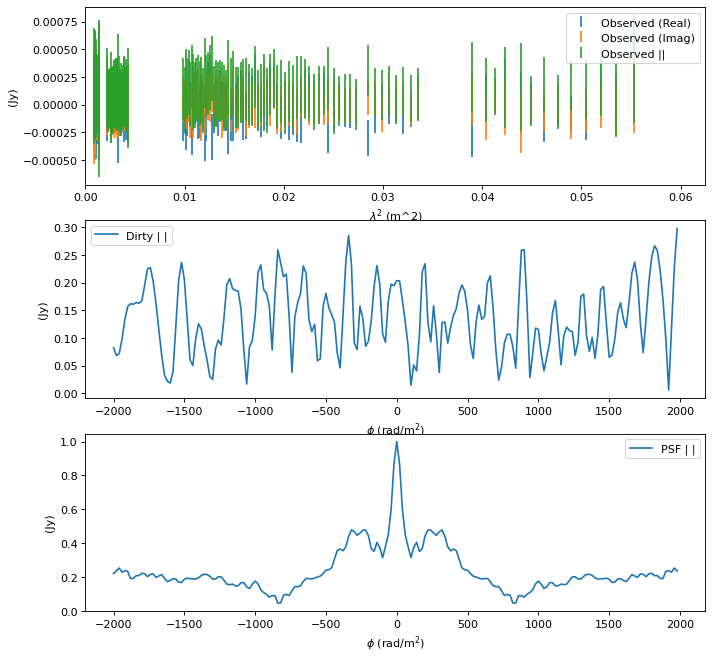

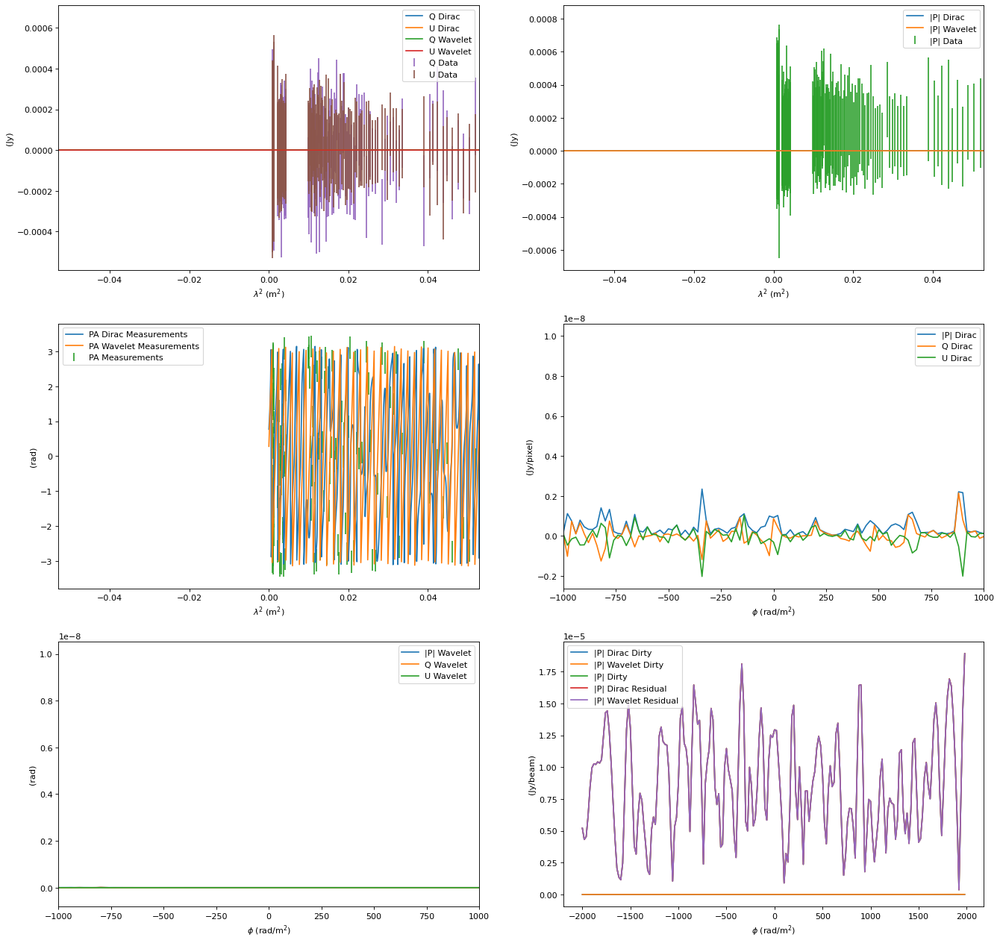

In [6]:
source = sources[0]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'1315-46'
153
2021-09-12 15:13:33,796 - Faraday Dreams - INFO - φ resolution 34.03475213787647 rad/m^2.
2021-09-12 15:13:33,797 - Faraday Dreams - INFO - φ max range is 248836.5746756769 rad/m^2.
2021-09-12 15:13:33,798 - Faraday Dreams - INFO - φ min range is 755.8231322121009 rad/m^2.
2021-09-12 15:13:33,821 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:13:33,823 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:13:33,825 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:13:33,827 - Optimus Primal - INFO - [Power Method] Converged with norm= 386.5200140561291, iter = 18, tol = 8.992190088246087e-05
2021-09-12 15:13:33,828 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:13:33,828 - Faraday Dreams - INFO - Using an estimated noise level of 9.14860938792117e-05 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:13:33,829 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrai

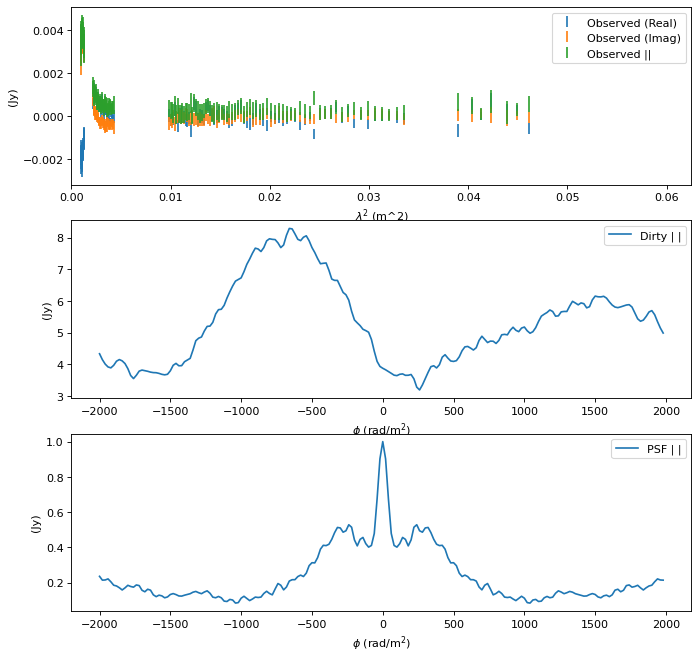

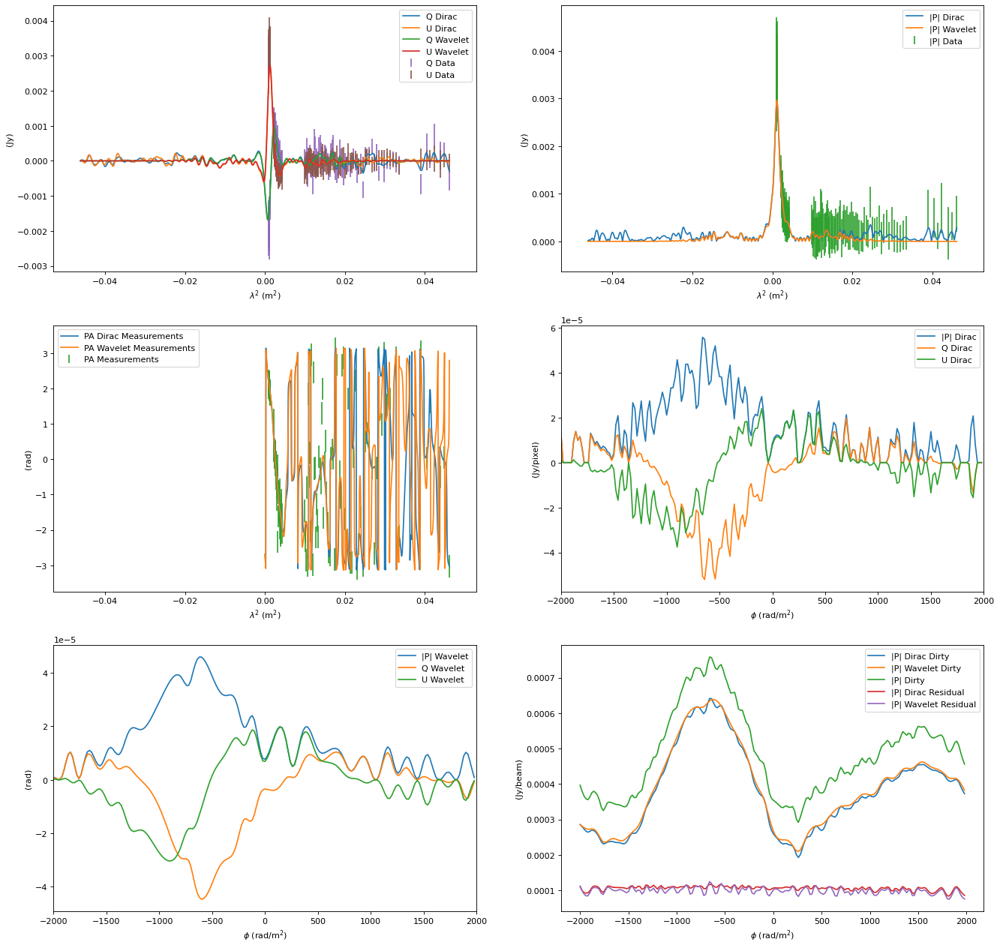

In [7]:
source = sources[1]
print(source)
wav = ['db4', 'db6', 'db8']
levels = 1
sig_factor = 1
rm_max = 2000
rm_min = -2000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1093'
139
2021-09-12 15:13:57,825 - Faraday Dreams - INFO - φ resolution 29.536645248022296 rad/m^2.
2021-09-12 15:13:57,826 - Faraday Dreams - INFO - φ max range is 264945.8222844962 rad/m^2.
2021-09-12 15:13:57,827 - Faraday Dreams - INFO - φ min range is 611.042261842698 rad/m^2.
2021-09-12 15:13:57,845 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:13:57,847 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:13:57,849 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:13:57,851 - Optimus Primal - INFO - [Power Method] Converged with norm= 626.1420822699091, iter = 12, tol = 8.209154083608498e-05
2021-09-12 15:13:57,852 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:13:57,852 - Faraday Dreams - INFO - Using an estimated noise level of 0.00017977526294998825 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:13:57,853 - Faraday Dreams - INFO - Reconstructing Faraday Depth using con

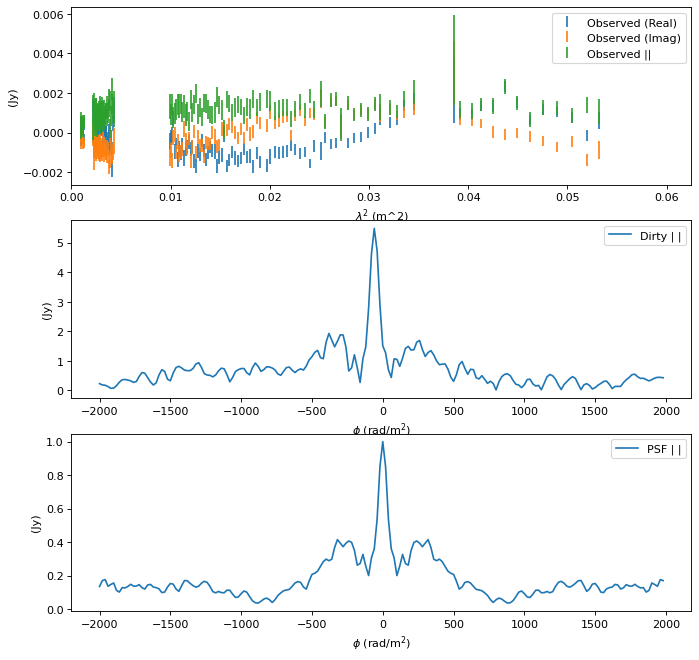

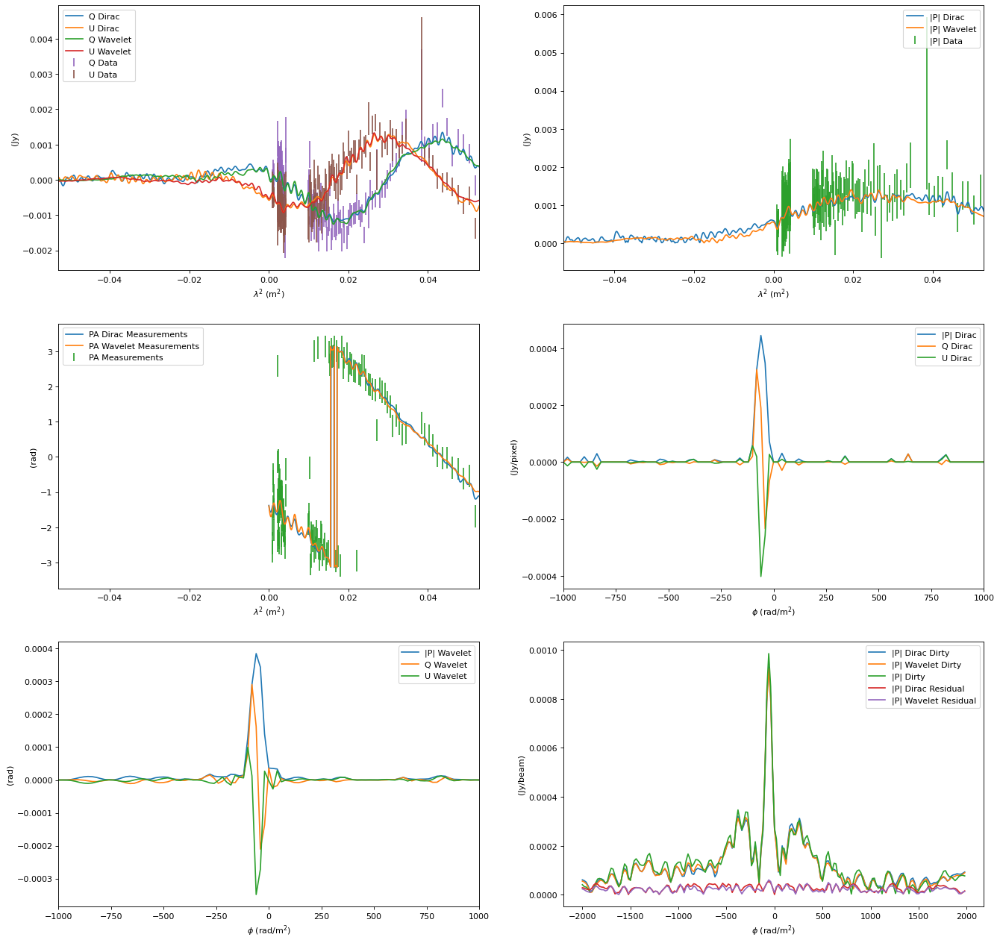

In [8]:
source = sources[2]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1152'
74
2021-09-12 15:14:18,510 - Faraday Dreams - INFO - φ resolution 36.986400433433204 rad/m^2.
2021-09-12 15:14:18,511 - Faraday Dreams - INFO - φ max range is 7599.759670343561 rad/m^2.
2021-09-12 15:14:18,511 - Faraday Dreams - INFO - φ min range is 856.2546674614404 rad/m^2.
2021-09-12 15:14:18,526 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:14:18,527 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:14:18,530 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:14:18,532 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:14:18,534 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2021-09-12 15:14:18,537 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2021-09-12 15:14:18,538 - Optimus Primal - INFO - [Power Method] Converged with norm= 32.73671498342951, iter = 43, tol = 9.083724116954832e-05
2021-09-12 15:14:18,539 - Faraday Dreams - INFO - Using wavelet

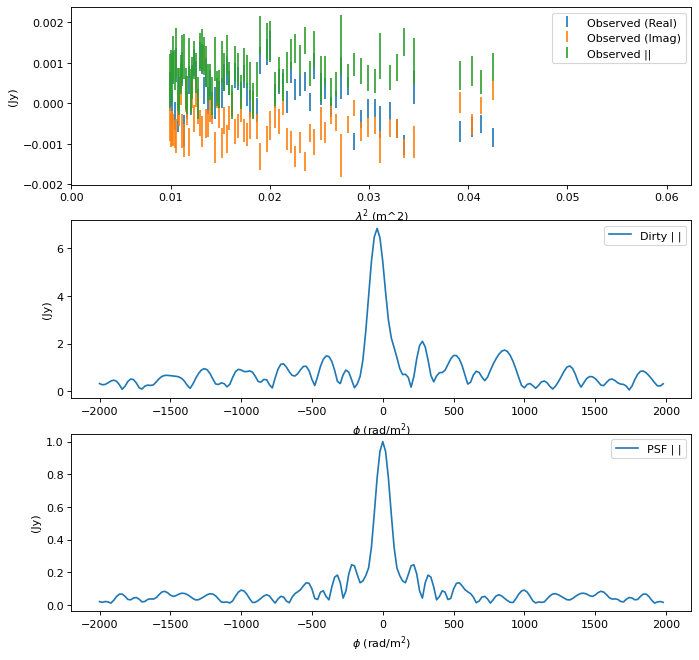

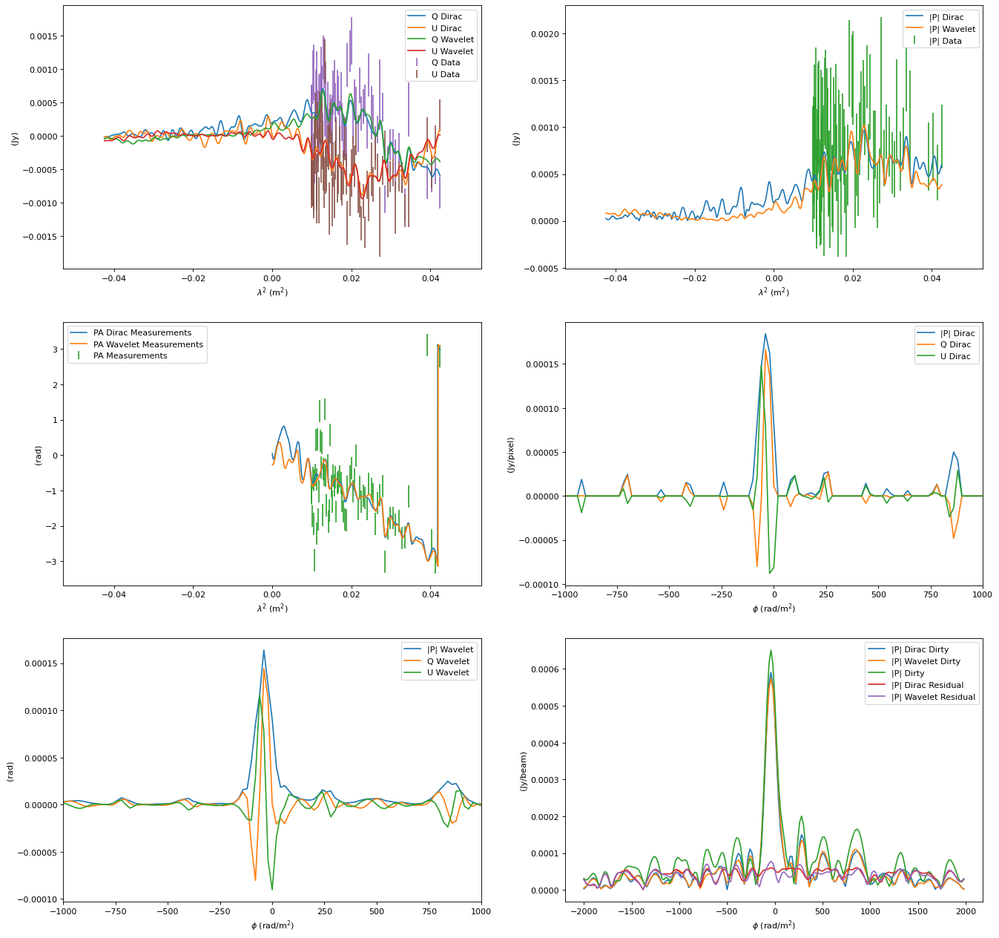

In [9]:
source = sources[3]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1435'
127
2021-09-12 15:14:33,376 - Faraday Dreams - INFO - φ resolution 31.335763000396227 rad/m^2.
2021-09-12 15:14:33,376 - Faraday Dreams - INFO - φ max range is 73189.80287057739 rad/m^2.
2021-09-12 15:14:33,377 - Faraday Dreams - INFO - φ min range is 667.7176559942264 rad/m^2.
2021-09-12 15:14:33,397 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:14:33,399 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:14:33,401 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:14:33,402 - Optimus Primal - INFO - [Power Method] Converged with norm= 148.0916880989615, iter = 13, tol = 9.150732987529345e-05
2021-09-12 15:14:33,403 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:14:33,403 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002246914809802547 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:14:33,404 - Faraday Dreams - INFO - Reconstructing Faraday Depth using con

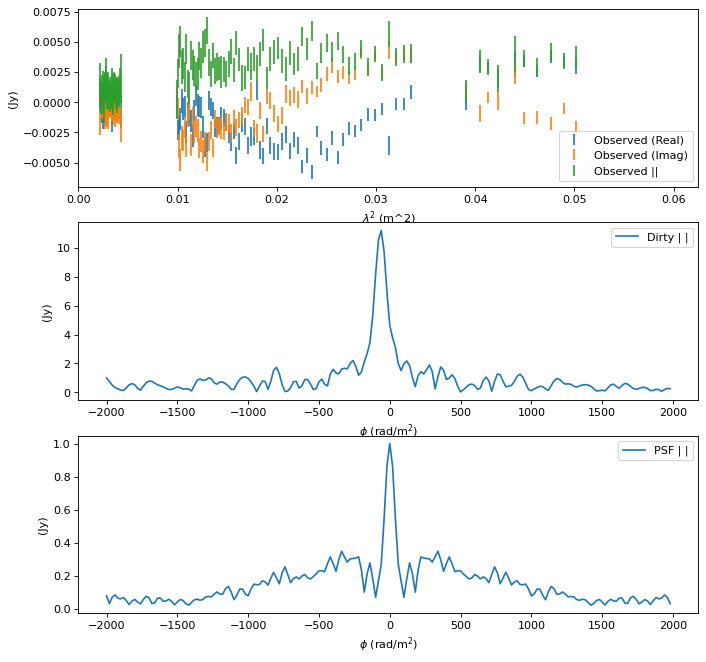

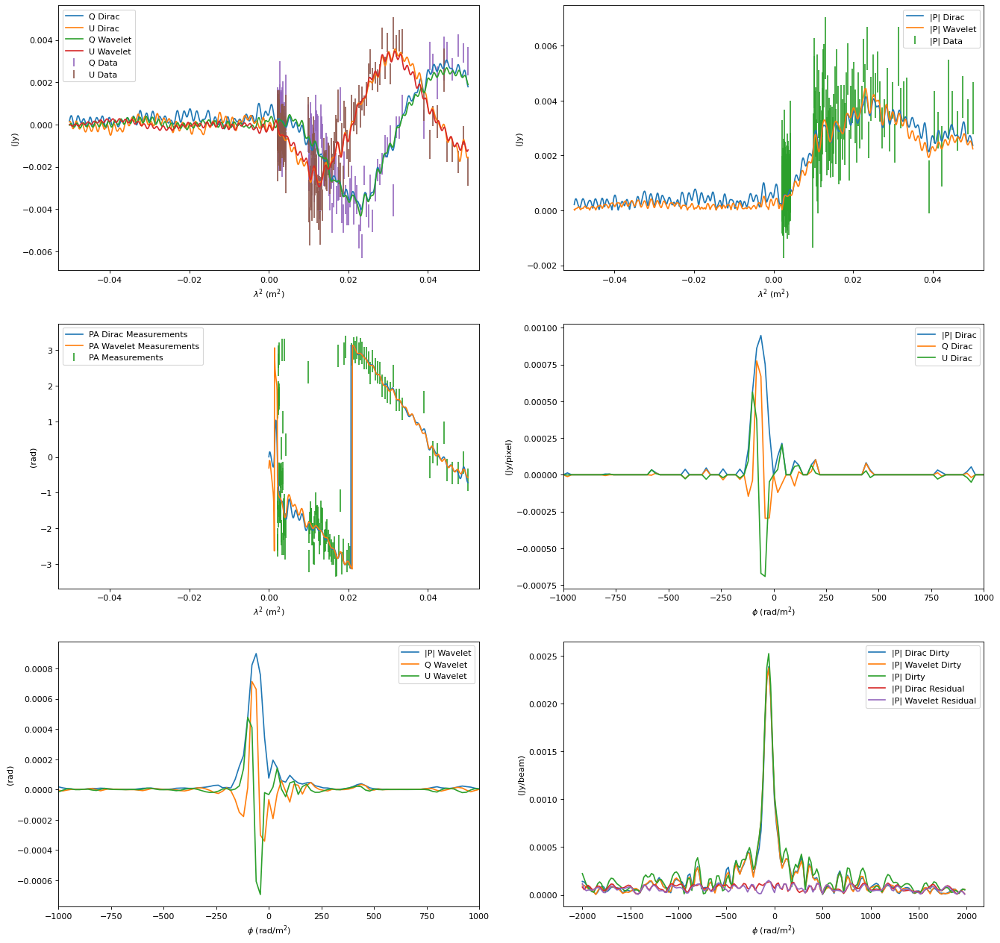

In [10]:
source = sources[4]
print(source)
wav = ['db4', 'db6', 'db8']
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1466'
123
2021-09-12 15:14:51,155 - Faraday Dreams - INFO - φ resolution 31.33609063407889 rad/m^2.
2021-09-12 15:14:51,156 - Faraday Dreams - INFO - φ max range is 264935.07814653846 rad/m^2.
2021-09-12 15:14:51,156 - Faraday Dreams - INFO - φ min range is 667.7281288668529 rad/m^2.
2021-09-12 15:14:51,176 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:14:51,177 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:14:51,179 - Optimus Primal - INFO - [Power Method] Converged with norm= 247.13578151299535, iter = 6, tol = 8.491911267642962e-05
2021-09-12 15:14:51,180 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:14:51,180 - Faraday Dreams - INFO - Using an estimated noise level of 0.0001487546687712893 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:14:51,181 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:14:51,182 - Optimus Primal - INFO - Running F

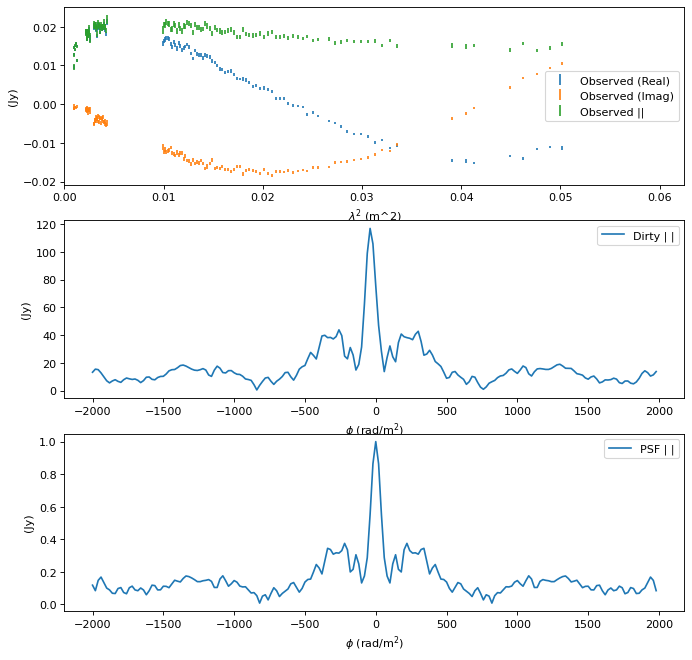

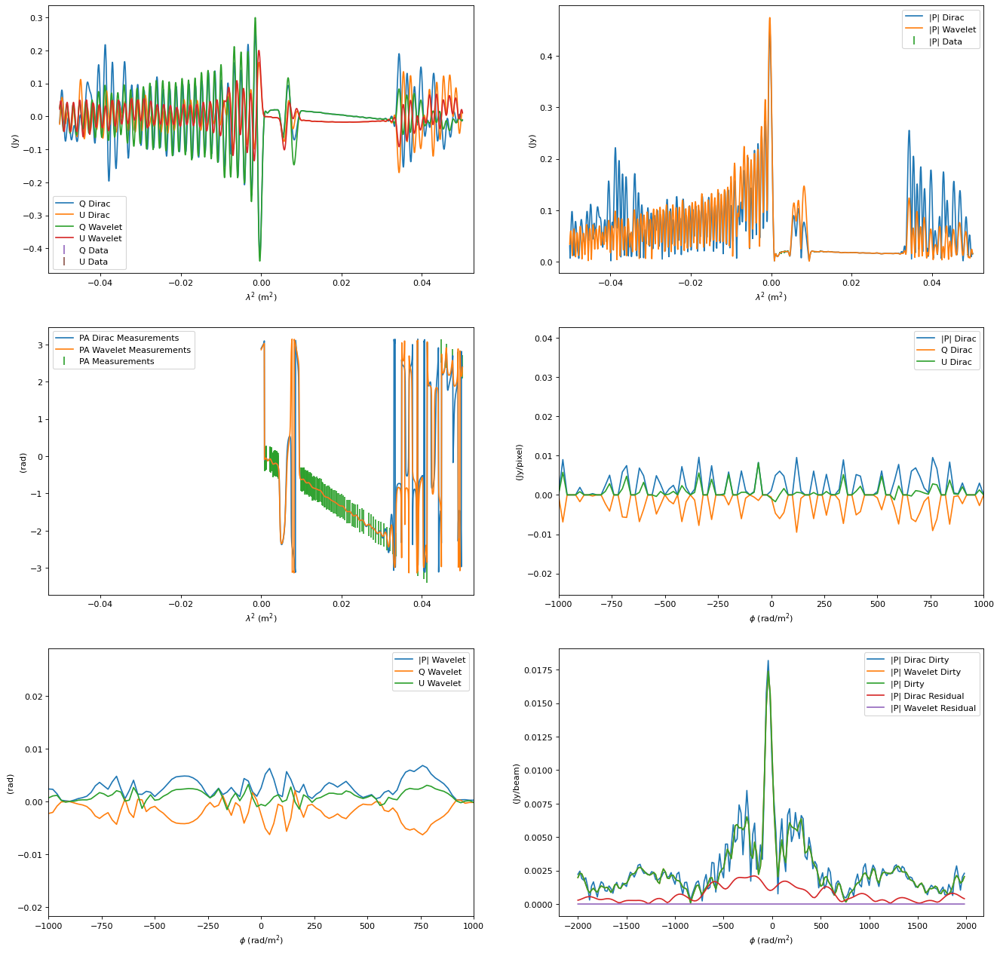

In [11]:
source = sources[5]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-2, 1e-2
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1573'
136
2021-09-12 15:15:59,293 - Faraday Dreams - INFO - φ resolution 31.12997412721653 rad/m^2.
2021-09-12 15:15:59,293 - Faraday Dreams - INFO - φ max range is 264957.53614930593 rad/m^2.
2021-09-12 15:15:59,294 - Faraday Dreams - INFO - φ min range is 661.1504054950489 rad/m^2.
2021-09-12 15:15:59,316 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:15:59,317 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:15:59,319 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:15:59,321 - Optimus Primal - INFO - [Power Method] Converged with norm= 211.46612865703972, iter = 18, tol = 6.658446405648683e-05
2021-09-12 15:15:59,322 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:15:59,323 - Faraday Dreams - INFO - Using an estimated noise level of 0.00011901444668183103 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:15:59,324 - Faraday Dreams - INFO - Reconstructing Faraday Depth using c

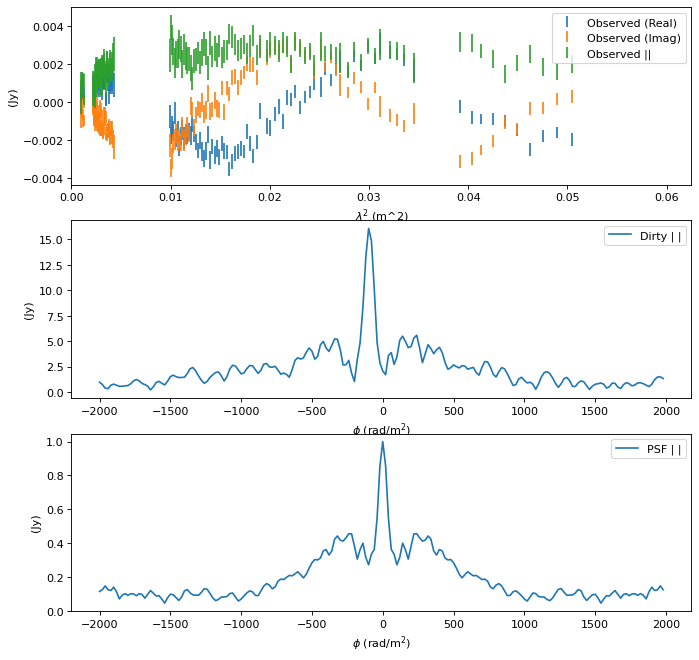

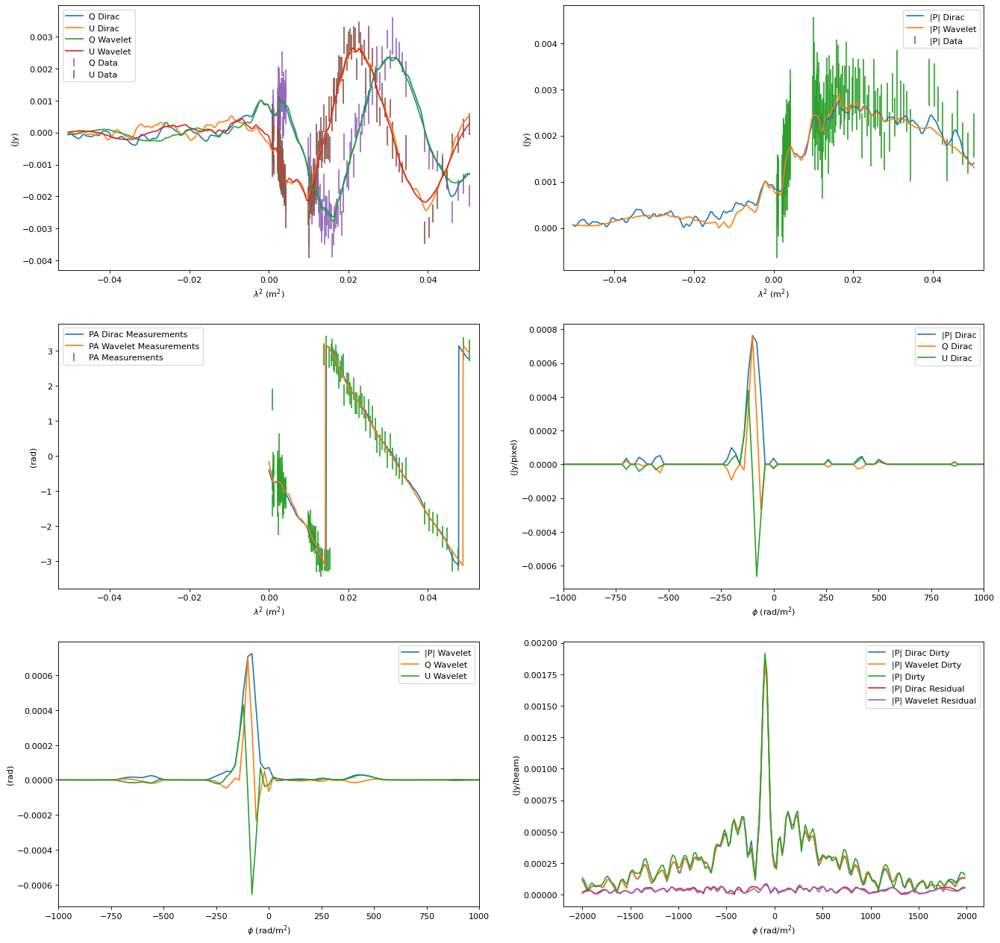

In [12]:
source = sources[6]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1636'
126
2021-09-12 15:16:15,203 - Faraday Dreams - INFO - φ resolution 31.3356693910872 rad/m^2.
2021-09-12 15:16:15,204 - Faraday Dreams - INFO - φ max range is 73188.77491479639 rad/m^2.
2021-09-12 15:16:15,204 - Faraday Dreams - INFO - φ min range is 667.714663765011 rad/m^2.
2021-09-12 15:16:15,224 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:16:15,225 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:16:15,228 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:16:15,230 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:16:15,231 - Optimus Primal - INFO - [Power Method] Converged with norm= 104.0581978637049, iter = 22, tol = 7.55881905159417e-05
2021-09-12 15:16:15,232 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:16:15,232 - Faraday Dreams - INFO - Using an estimated noise level of 7.668026955798268e-05 (weighted image units, i.e. Jy/Beam)
2021-0

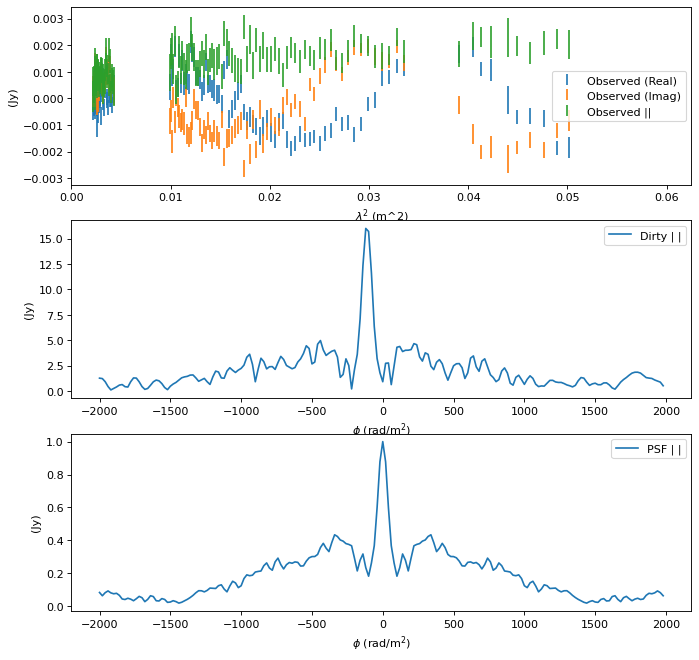

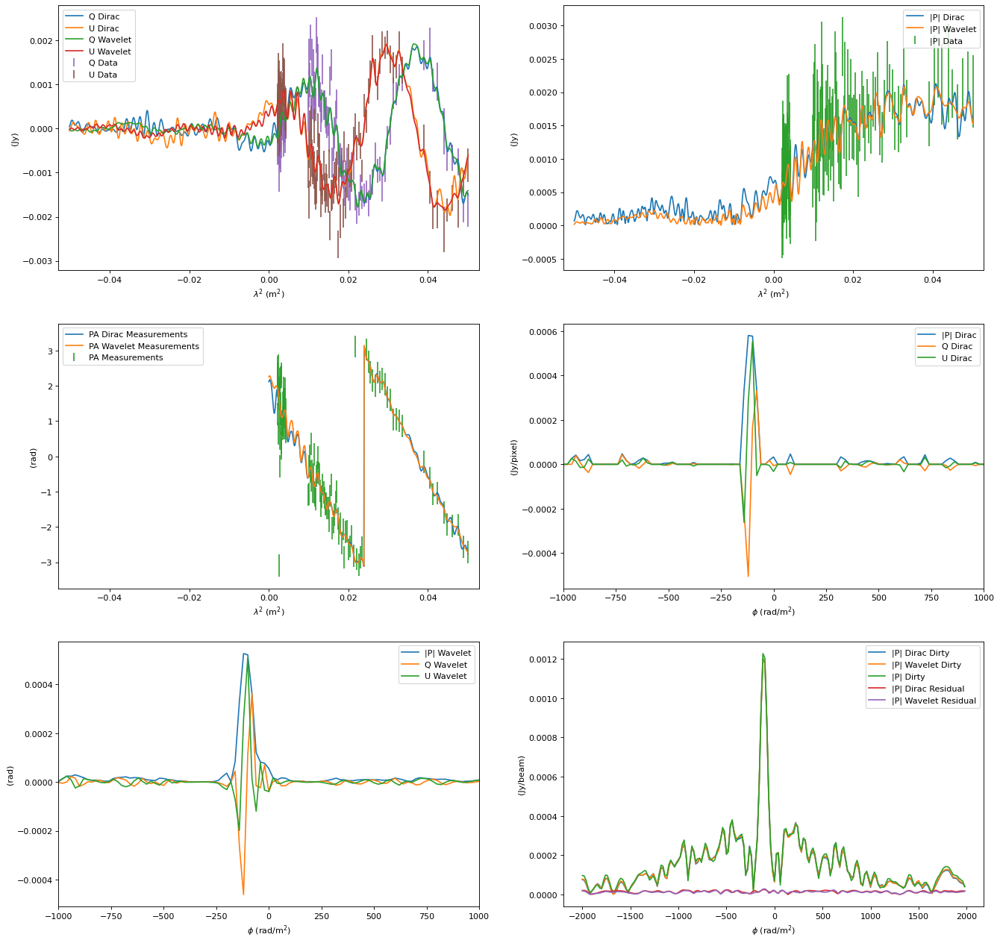

In [13]:
source = sources[7]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1640'
130
2021-09-12 15:16:39,229 - Faraday Dreams - INFO - φ resolution 29.56787160290564 rad/m^2.
2021-09-12 15:16:39,230 - Faraday Dreams - INFO - φ max range is 73208.23917837784 rad/m^2.
2021-09-12 15:16:39,231 - Faraday Dreams - INFO - φ min range is 612.0115918453794 rad/m^2.
2021-09-12 15:16:39,252 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:16:39,253 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:16:39,255 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:16:39,258 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:16:39,259 - Optimus Primal - INFO - [Power Method] Converged with norm= 1591.0562783318876, iter = 22, tol = 8.2719218164541e-05
2021-09-12 15:16:39,259 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:16:39,260 - Faraday Dreams - INFO - Using an estimated noise level of 0.0004703365557361394 (weighted image units, i.e. Jy/Beam)
2021

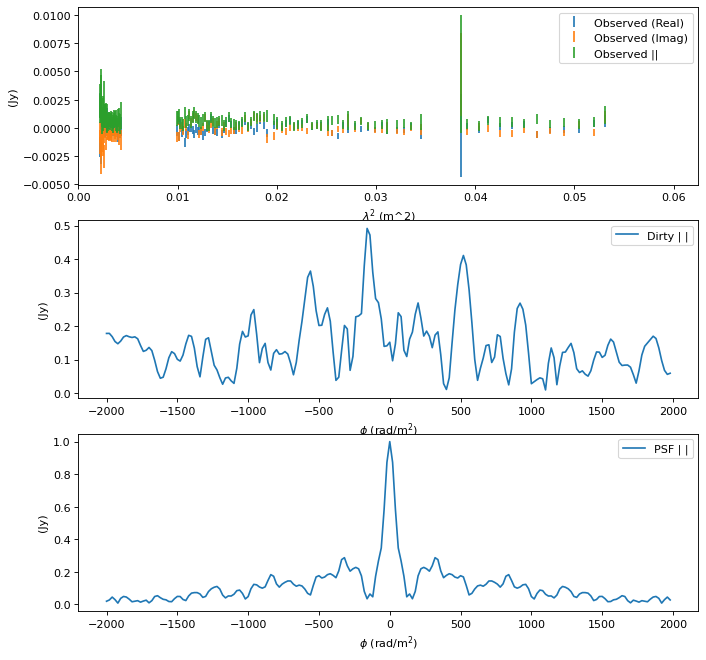

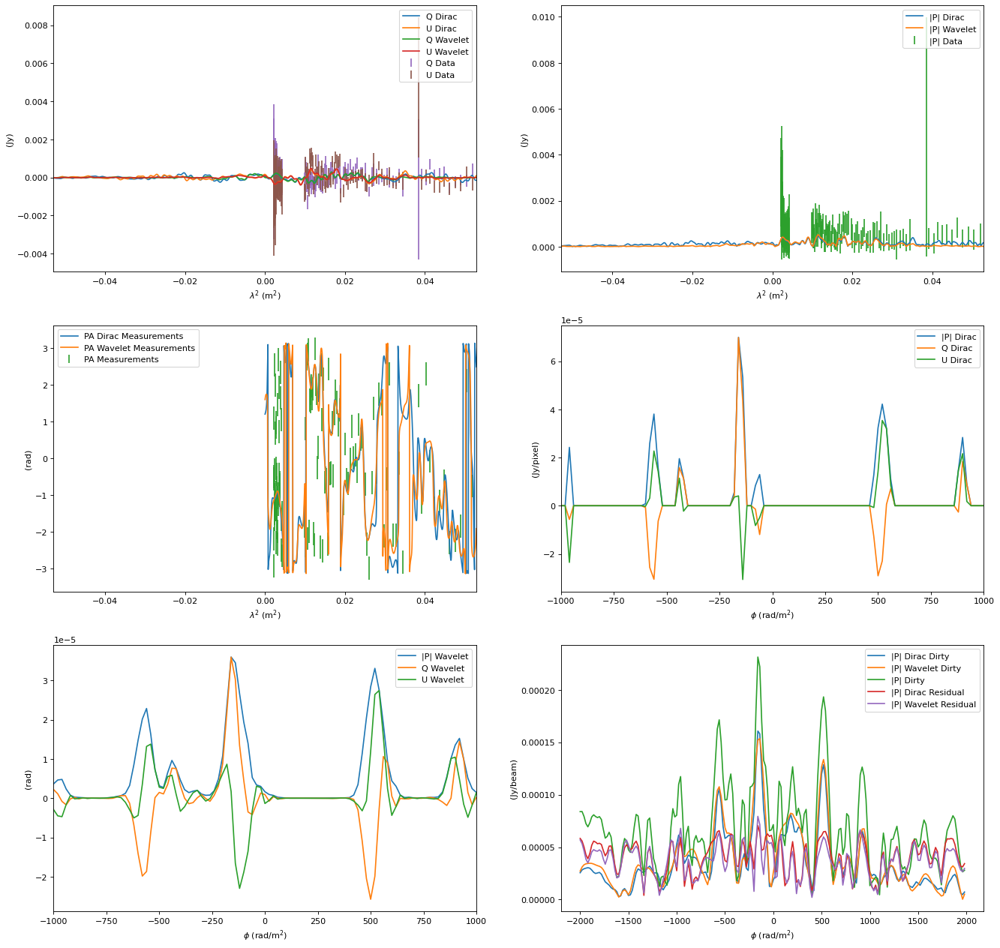

In [14]:
source = sources[8]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1748'
141
2021-09-12 15:17:02,971 - Faraday Dreams - INFO - φ resolution 34.96770912678917 rad/m^2.
2021-09-12 15:17:02,972 - Faraday Dreams - INFO - φ max range is 264939.68274152104 rad/m^2.
2021-09-12 15:17:02,972 - Faraday Dreams - INFO - φ min range is 787.1151158588428 rad/m^2.
2021-09-12 15:17:02,995 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:17:02,996 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:17:02,998 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:17:03,001 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:17:03,002 - Optimus Primal - INFO - [Power Method] Converged with norm= 403.70788836027543, iter = 25, tol = 8.81620939459002e-05
2021-09-12 15:17:03,003 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:17:03,003 - Faraday Dreams - INFO - Using an estimated noise level of 9.665577090345323e-05 (weighted image units, i.e. Jy/Beam)
20

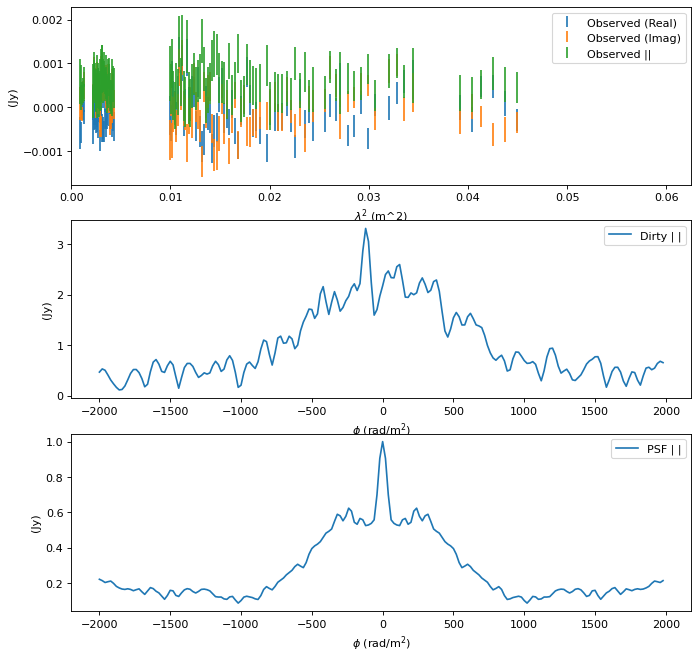

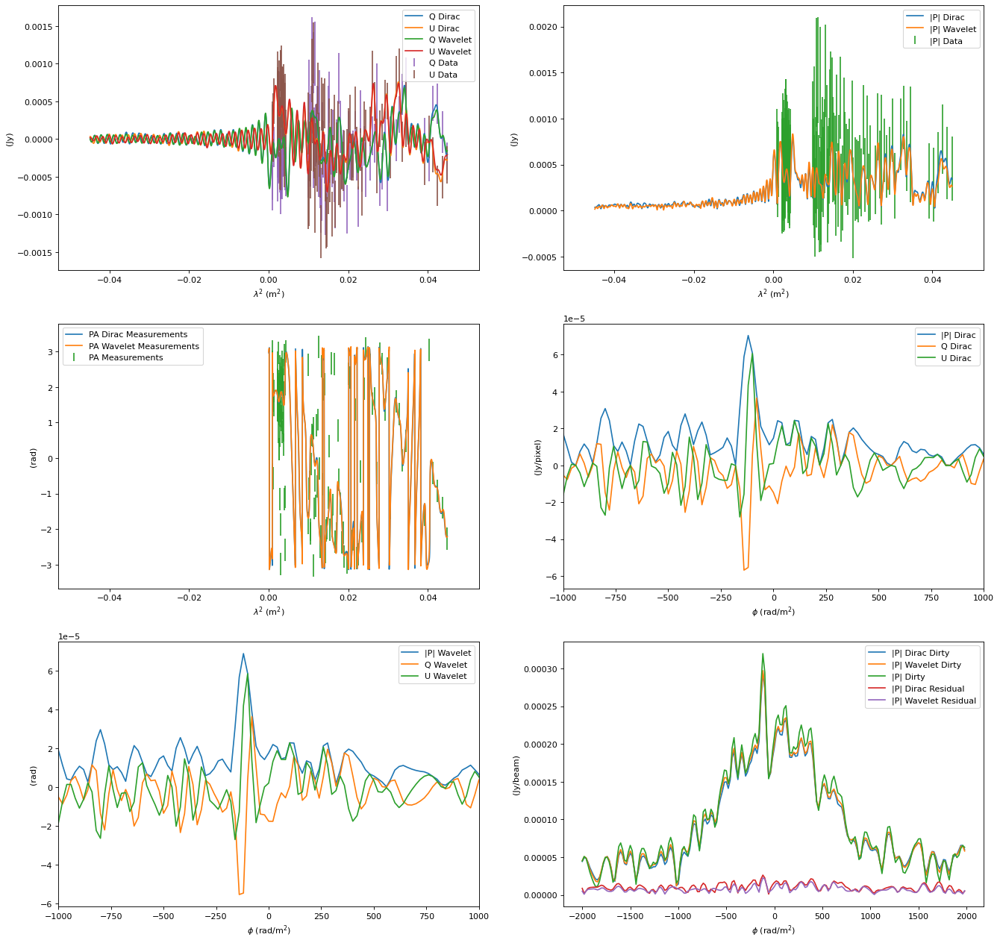

In [15]:
source = sources[9]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-4, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1764'
126
2021-09-12 15:17:29,659 - Faraday Dreams - INFO - φ resolution 31.3352949552493 rad/m^2.
2021-09-12 15:17:29,660 - Faraday Dreams - INFO - φ max range is 73189.46021757845 rad/m^2.
2021-09-12 15:17:29,660 - Faraday Dreams - INFO - φ min range is 667.7026949375668 rad/m^2.
2021-09-12 15:17:29,681 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:17:29,682 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:17:29,685 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:17:29,686 - Optimus Primal - INFO - [Power Method] Converged with norm= 214.8279529859191, iter = 15, tol = 7.95472495858914e-05
2021-09-12 15:17:29,687 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:17:29,687 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002510356949642301 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:17:29,688 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constr

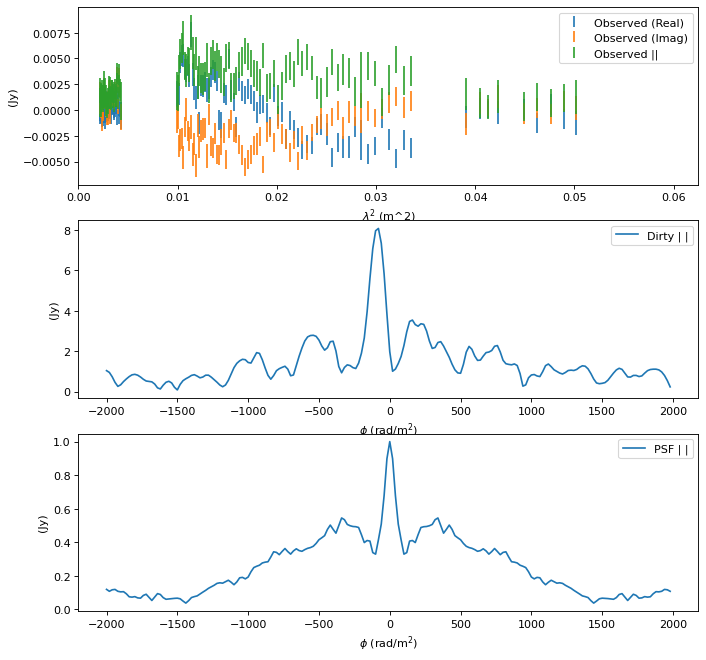

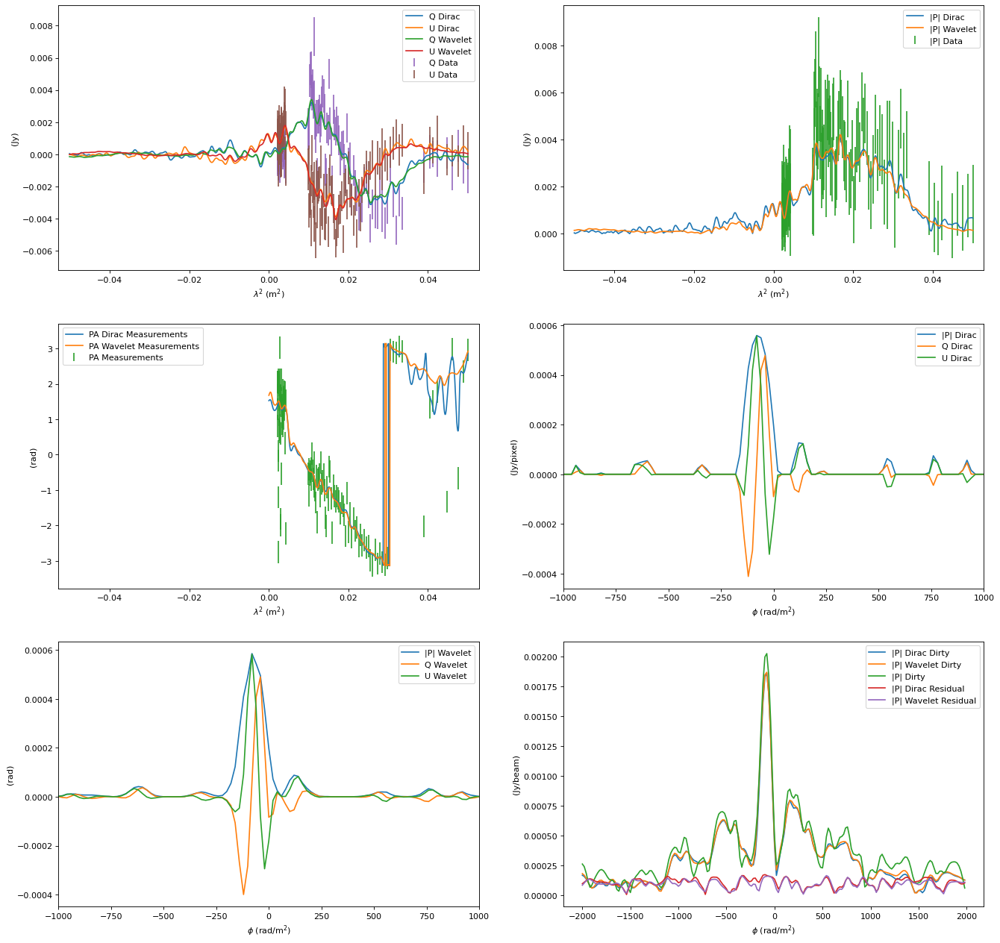

In [16]:
source = sources[10]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.4
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1827'
128
2021-09-12 15:17:49,231 - Faraday Dreams - INFO - φ resolution 31.335716195724235 rad/m^2.
2021-09-12 15:17:49,232 - Faraday Dreams - INFO - φ max range is 264996.88110519666 rad/m^2.
2021-09-12 15:17:49,232 - Faraday Dreams - INFO - φ min range is 667.7161598785017 rad/m^2.
2021-09-12 15:17:49,251 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:17:49,252 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:17:49,254 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:17:49,257 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:17:49,258 - Optimus Primal - INFO - [Power Method] Converged with norm= 240.3324542328275, iter = 25, tol = 8.813264694903489e-05
2021-09-12 15:17:49,259 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:17:49,259 - Faraday Dreams - INFO - Using an estimated noise level of 0.00019677587260957807 (weighted image units, i.e. Jy/Beam)


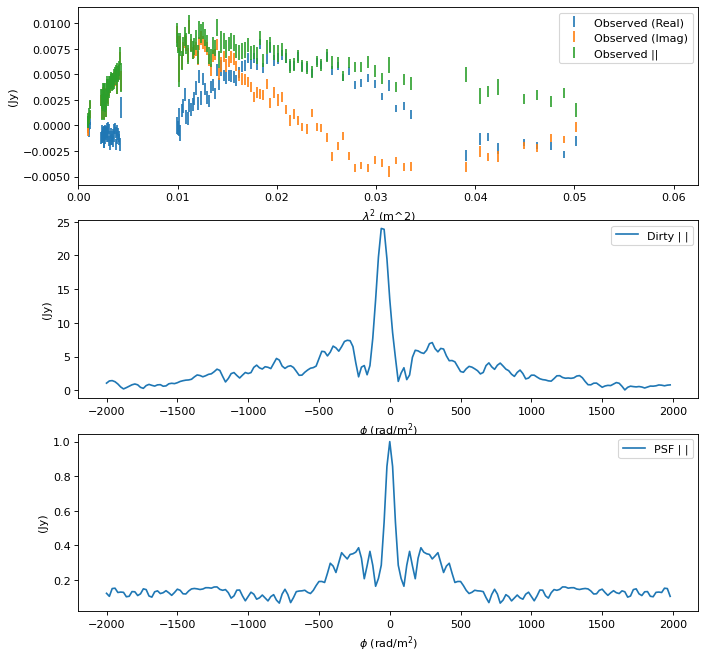

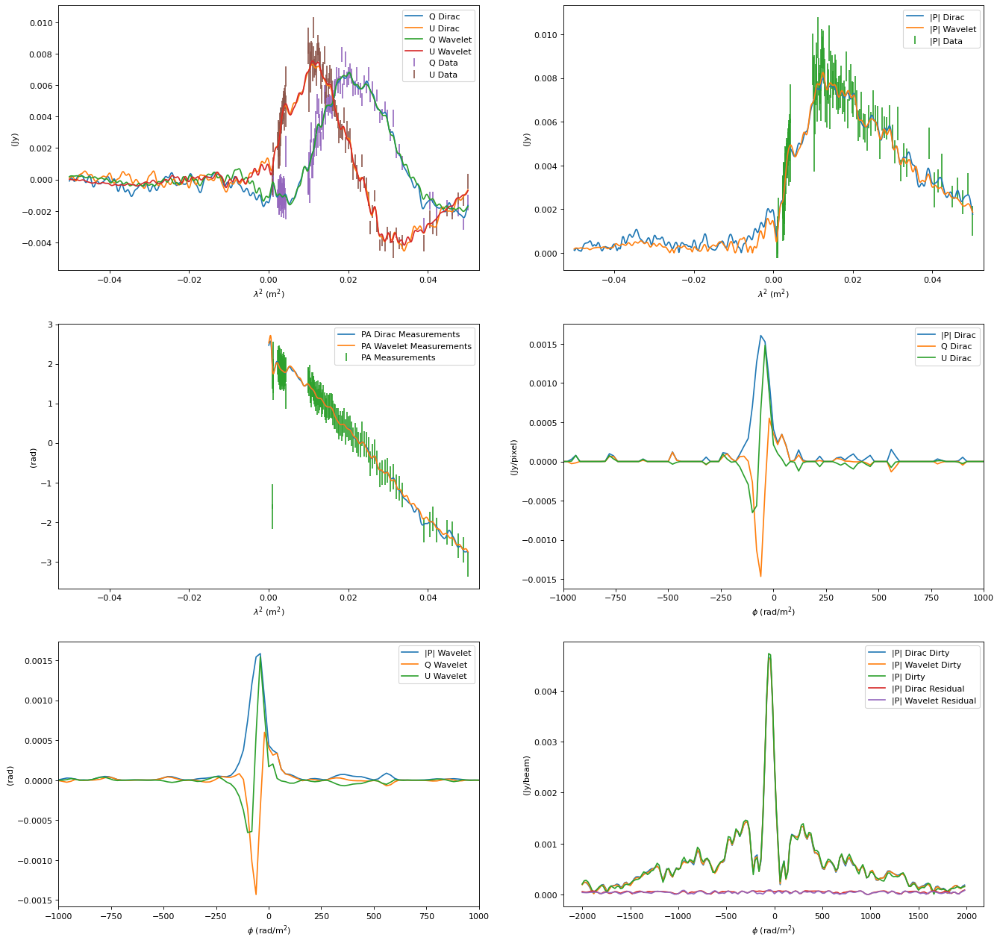

In [17]:
source = sources[11]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1832'
128
2021-09-12 15:18:01,002 - Faraday Dreams - INFO - φ resolution 30.203214932897044 rad/m^2.
2021-09-12 15:18:01,002 - Faraday Dreams - INFO - φ max range is 73206.55990697186 rad/m^2.
2021-09-12 15:18:01,003 - Faraday Dreams - INFO - φ min range is 631.8447661934783 rad/m^2.
2021-09-12 15:18:01,027 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:18:01,028 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:18:01,030 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:18:01,033 - Optimus Primal - INFO - [Power Method] Converged with norm= 177.078648609579, iter = 21, tol = 9.965859967773737e-05
2021-09-12 15:18:01,033 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:18:01,034 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010389637900516392 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:18:01,034 - Faraday Dreams - INFO - Reconstructing Faraday Depth using con

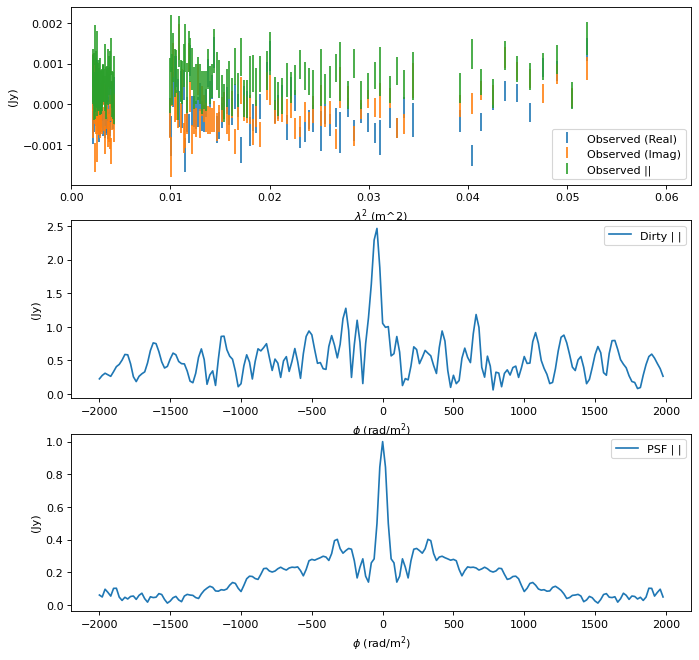

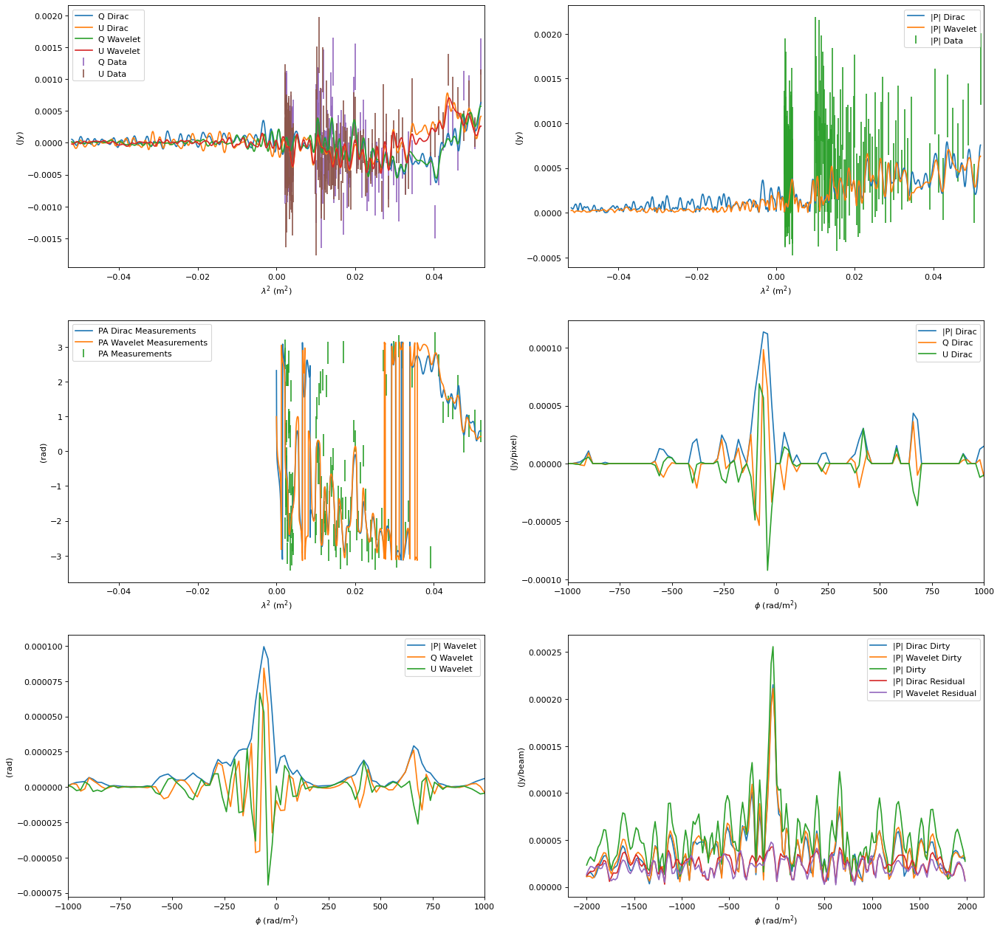

In [18]:
source = sources[12]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_c1972'
106
2021-09-12 15:18:28,756 - Faraday Dreams - INFO - φ resolution 30.279219840281318 rad/m^2.
2021-09-12 15:18:28,757 - Faraday Dreams - INFO - φ max range is 264927.48472048645 rad/m^2.
2021-09-12 15:18:28,758 - Faraday Dreams - INFO - φ min range is 634.2314597573563 rad/m^2.
2021-09-12 15:18:28,775 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:18:28,777 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:18:28,779 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:18:28,781 - Optimus Primal - INFO - [Power Method] Converged with norm= 448.7671455837076, iter = 20, tol = 6.257424188855805e-05
2021-09-12 15:18:28,782 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:18:28,782 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012695739860646427 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:18:28,783 - Faraday Dreams - INFO - Reconstructing Faraday Depth using c

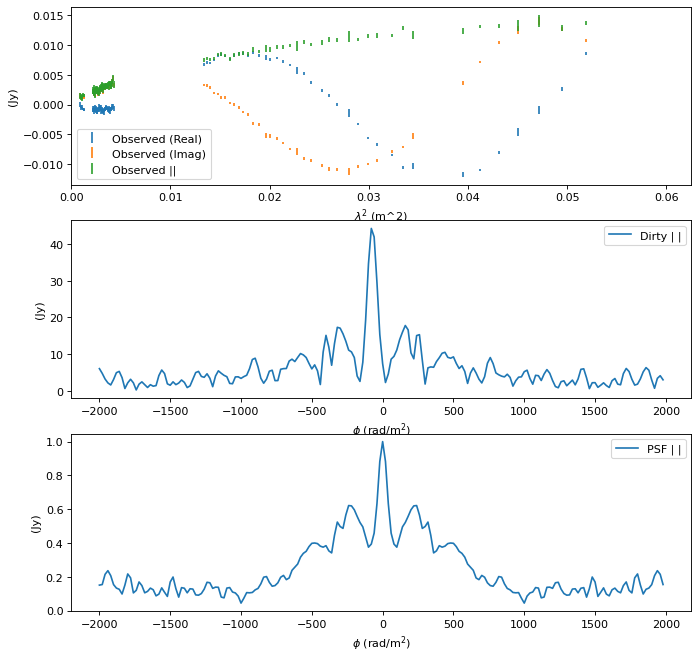

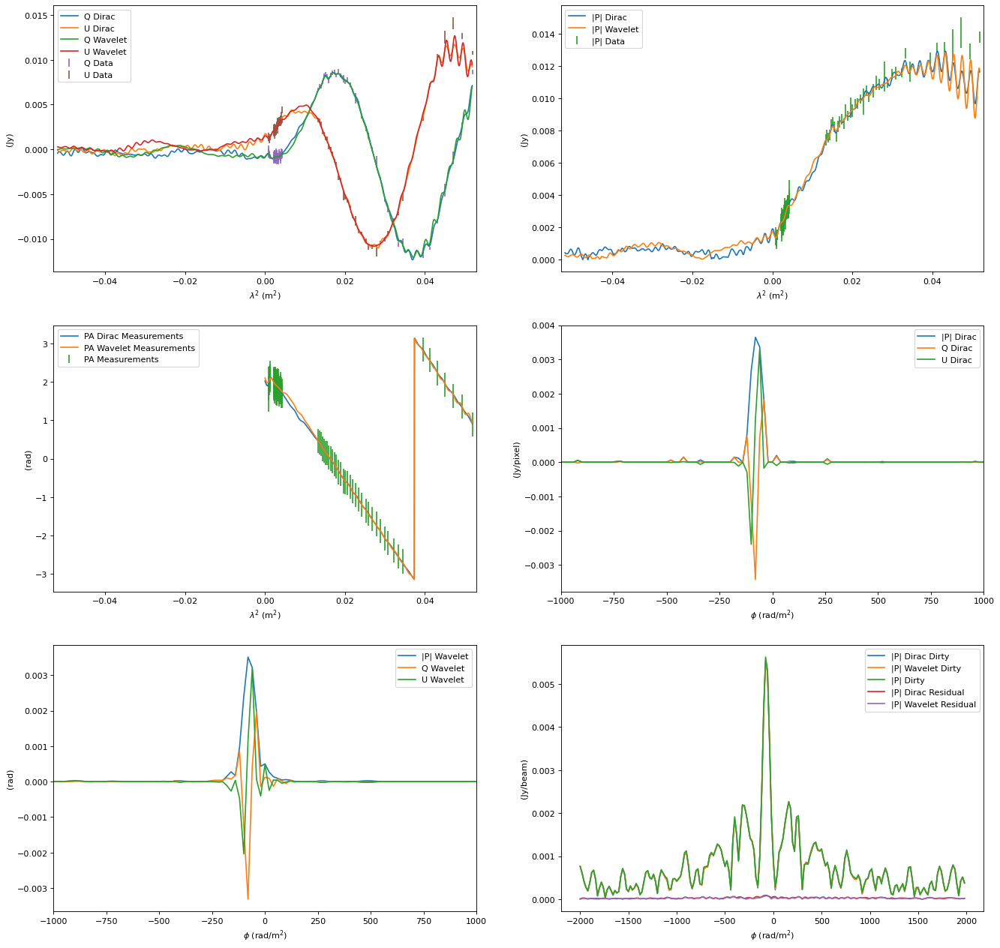

In [19]:
source = sources[13]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1014'
79
2021-09-12 15:19:11,104 - Faraday Dreams - INFO - φ resolution 32.06889103536392 rad/m^2.
2021-09-12 15:19:11,105 - Faraday Dreams - INFO - φ max range is 7598.525842253322 rad/m^2.
2021-09-12 15:19:11,105 - Faraday Dreams - INFO - φ min range is 691.2887191225753 rad/m^2.
2021-09-12 15:19:11,122 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:19:11,123 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:19:11,125 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:19:11,127 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:19:11,130 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2021-09-12 15:19:11,132 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2021-09-12 15:19:11,135 - Optimus Primal - INFO - [Power Method] iter = 51, tol = 0.0
2021-09-12 15:19:11,136 - Optimus Primal - INFO - [Power Method] Converged with norm= 27.141690191231376, iter = 52, tol =

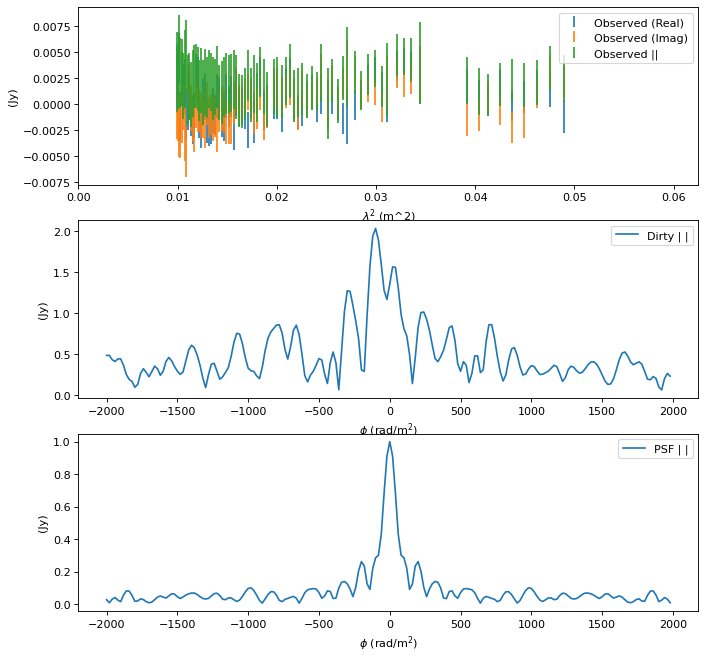

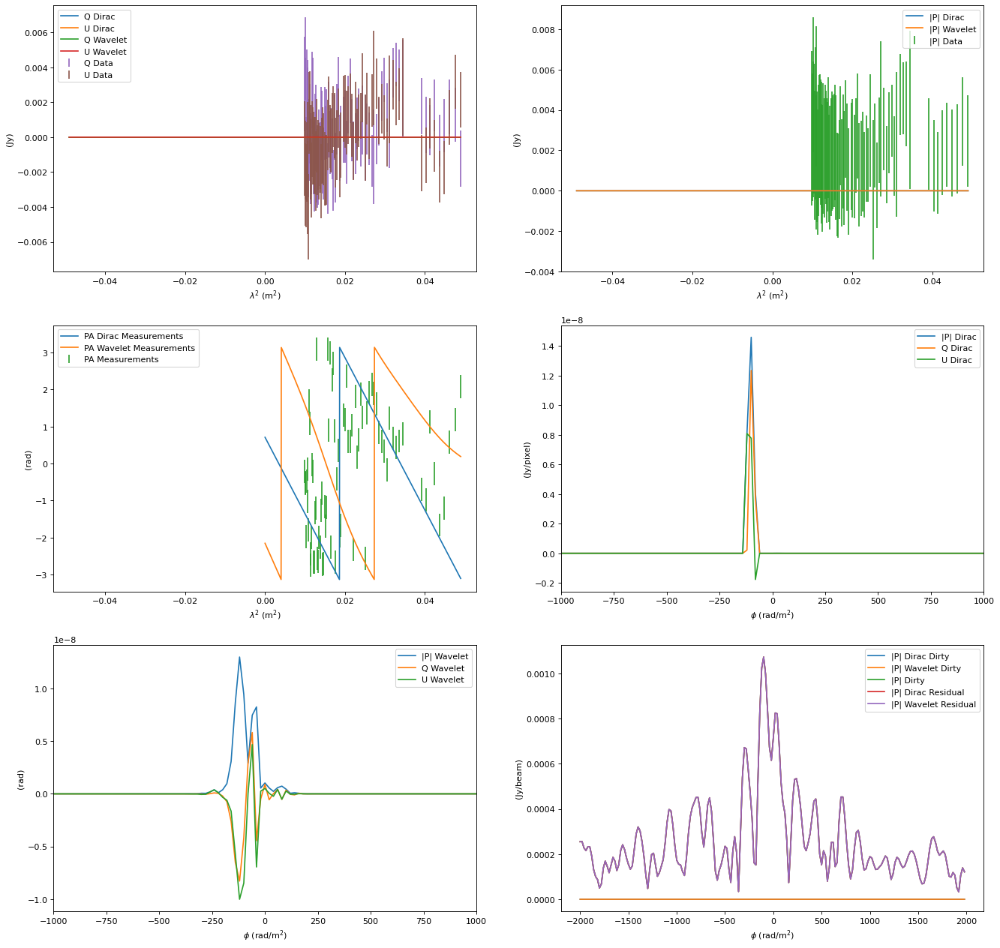

In [20]:
source = sources[14]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1031'
130
2021-09-12 15:19:15,637 - Faraday Dreams - INFO - φ resolution 29.538417481499827 rad/m^2.
2021-09-12 15:19:15,639 - Faraday Dreams - INFO - φ max range is 73207.82792586304 rad/m^2.
2021-09-12 15:19:15,639 - Faraday Dreams - INFO - φ min range is 611.0972618892057 rad/m^2.
2021-09-12 15:19:15,660 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:19:15,662 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:19:15,664 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:19:15,666 - Optimus Primal - INFO - [Power Method] Converged with norm= 408.58884855378477, iter = 13, tol = 6.0346036080283626e-05
2021-09-12 15:19:15,666 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:19:15,667 - Faraday Dreams - INFO - Using an estimated noise level of 0.00015556170546915382 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:19:15,668 - Faraday Dreams - INFO - Reconstructing Faraday Depth using 

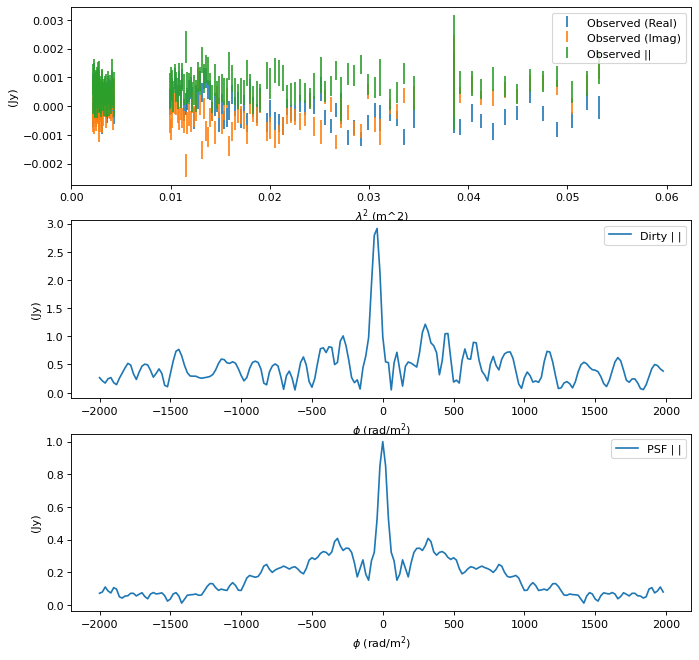

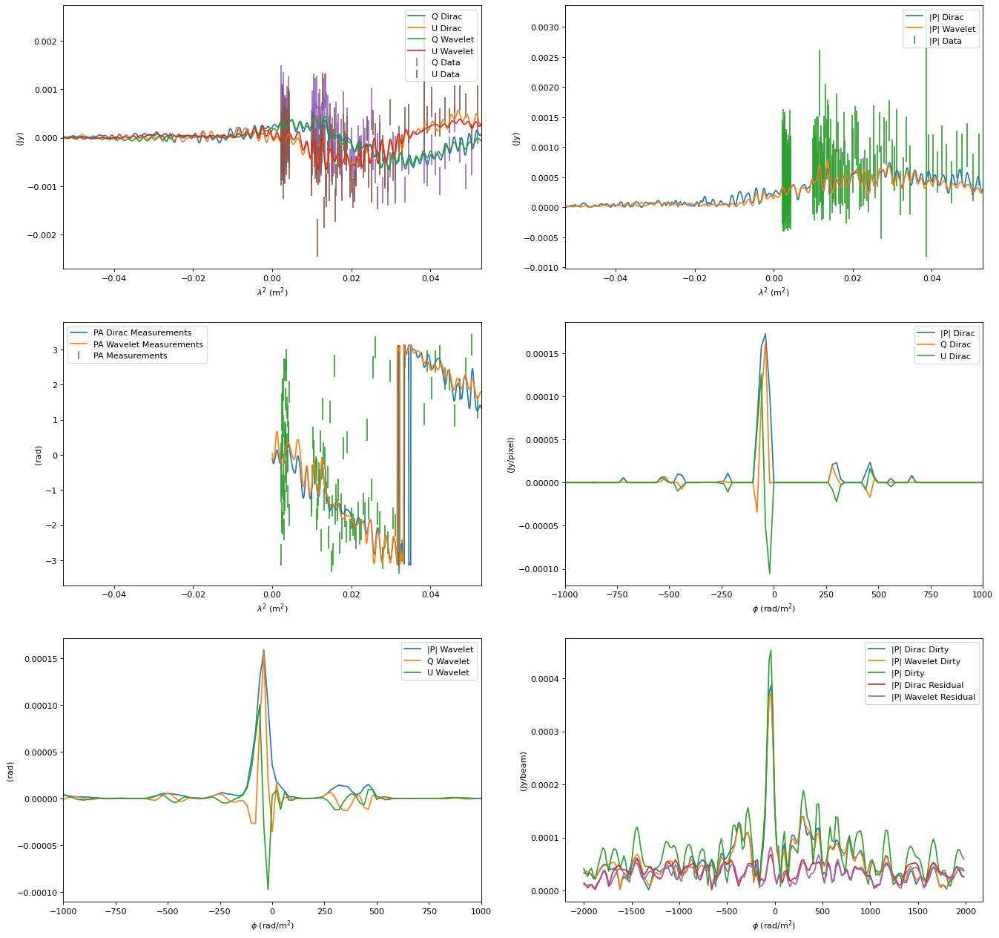

In [21]:
source = sources[15]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1.
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1290'
136
2021-09-12 15:19:38,806 - Faraday Dreams - INFO - φ resolution 31.336043829162218 rad/m^2.
2021-09-12 15:19:38,806 - Faraday Dreams - INFO - φ max range is 265036.3107583633 rad/m^2.
2021-09-12 15:19:38,807 - Faraday Dreams - INFO - φ min range is 667.7266327354831 rad/m^2.
2021-09-12 15:19:38,828 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:19:38,829 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:19:38,832 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:19:38,835 - Optimus Primal - INFO - [Power Method] Converged with norm= 198.9701936855398, iter = 21, tol = 8.150799120703123e-05
2021-09-12 15:19:38,836 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:19:38,836 - Faraday Dreams - INFO - Using an estimated noise level of 9.67267551459372e-05 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:19:38,837 - Faraday Dreams - INFO - Reconstructing Faraday Depth using cons

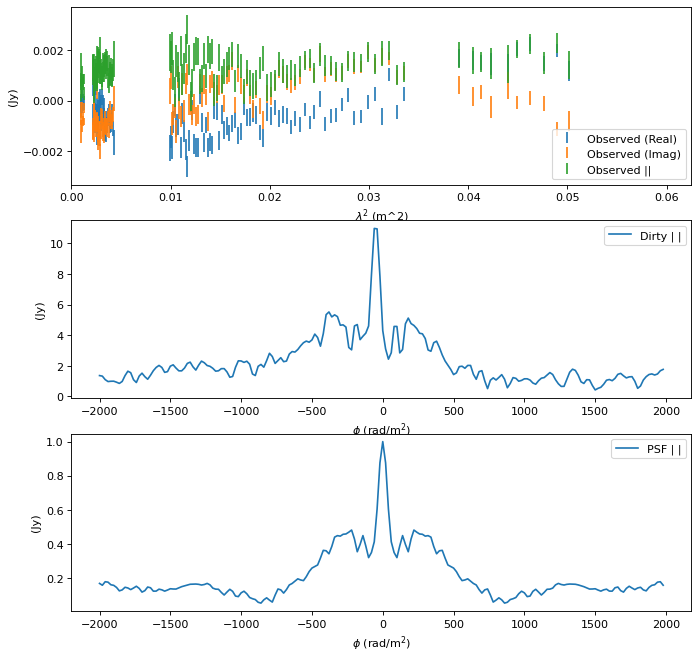

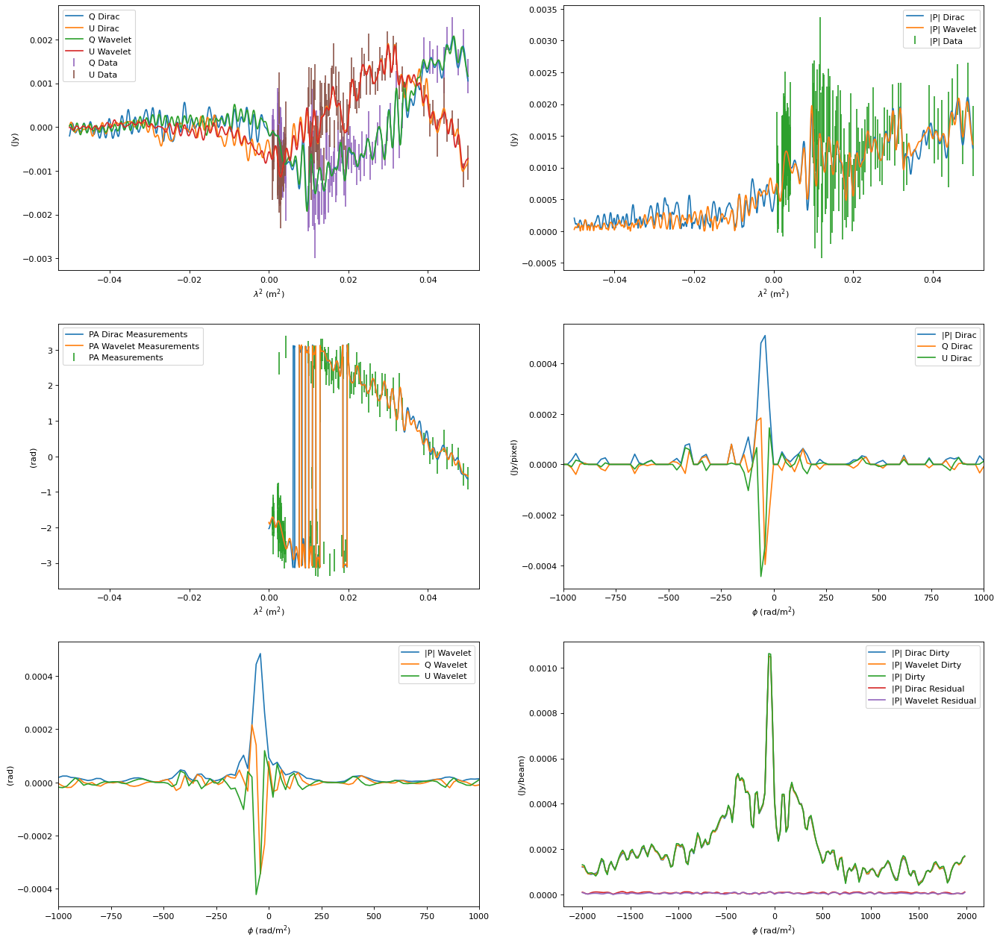

In [22]:
source = sources[16]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1349'
133
2021-09-12 15:20:06,671 - Faraday Dreams - INFO - φ resolution 32.96206193969296 rad/m^2.
2021-09-12 15:20:06,672 - Faraday Dreams - INFO - φ max range is 265004.79904138227 rad/m^2.
2021-09-12 15:20:06,673 - Faraday Dreams - INFO - φ min range is 720.3712907366929 rad/m^2.
2021-09-12 15:20:06,694 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:20:06,695 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:20:06,697 - Optimus Primal - INFO - [Power Method] Converged with norm= 518.1929877818529, iter = 5, tol = 4.464883841323967e-05
2021-09-12 15:20:06,697 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:20:06,698 - Faraday Dreams - INFO - Using an estimated noise level of 0.00027627250528894365 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:20:06,698 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:20:06,700 - Optimus Primal - INFO - Running F

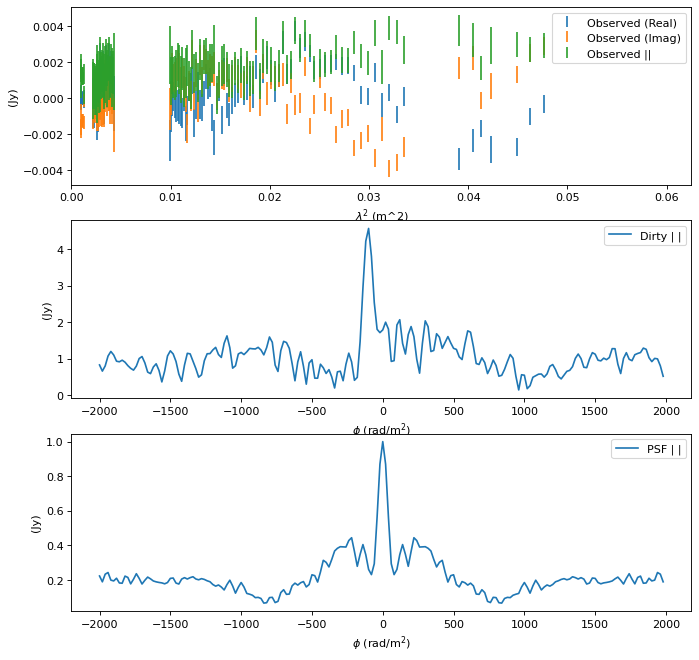

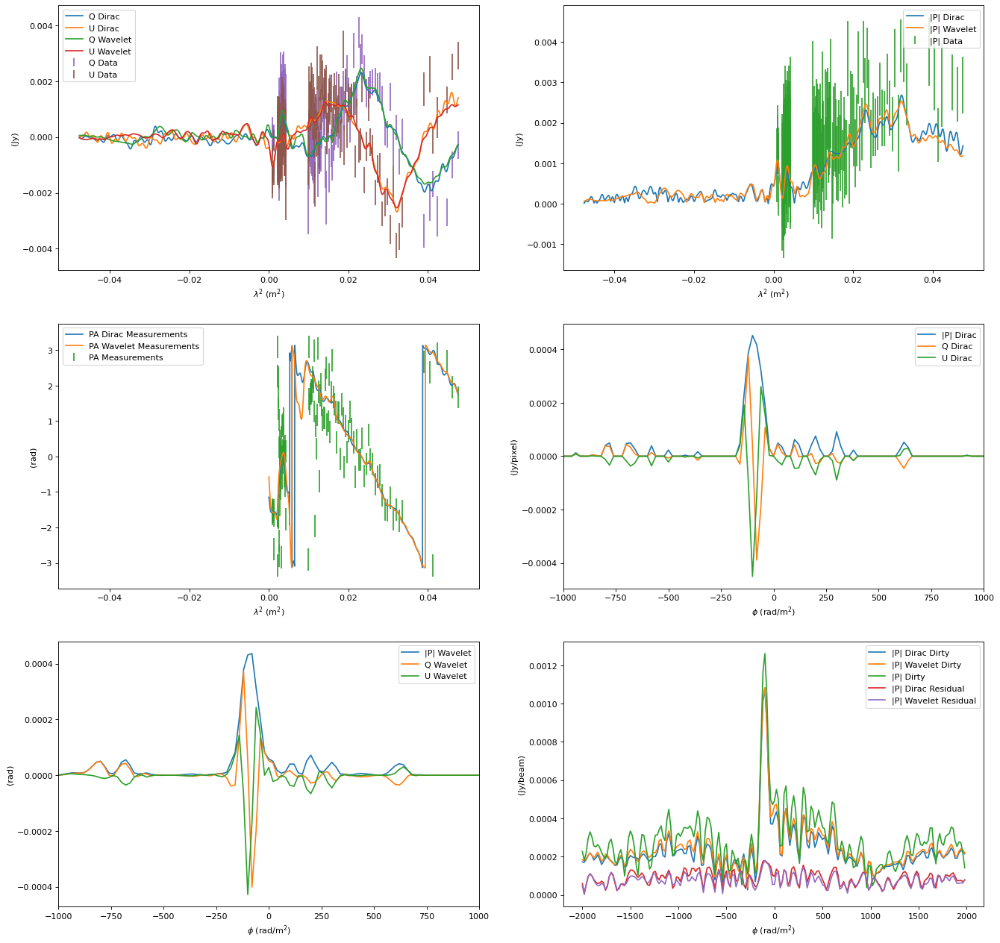

In [23]:
source = sources[17]
print(source)
wav = ["db8", "db6", "db4"]
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1382'
78
2021-09-12 15:20:32,285 - Faraday Dreams - INFO - φ resolution 32.06775466840783 rad/m^2.
2021-09-12 15:20:32,287 - Faraday Dreams - INFO - φ max range is 7597.557040188251 rad/m^2.
2021-09-12 15:20:32,287 - Faraday Dreams - INFO - φ min range is 691.2519728666861 rad/m^2.
2021-09-12 15:20:32,300 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:20:32,301 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:20:32,303 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:20:32,306 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:20:32,308 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2021-09-12 15:20:32,310 - Optimus Primal - INFO - [Power Method] iter = 41, tol = 0.0
2021-09-12 15:20:32,313 - Optimus Primal - INFO - [Power Method] iter = 51, tol = 0.0
2021-09-12 15:20:32,314 - Optimus Primal - INFO - [Power Method] Converged with norm= 28.16656909588431, iter = 53, tol = 

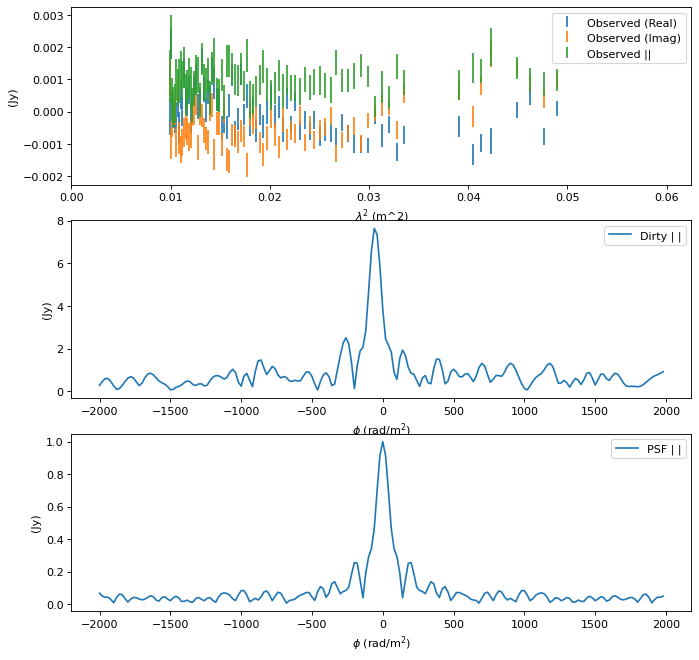

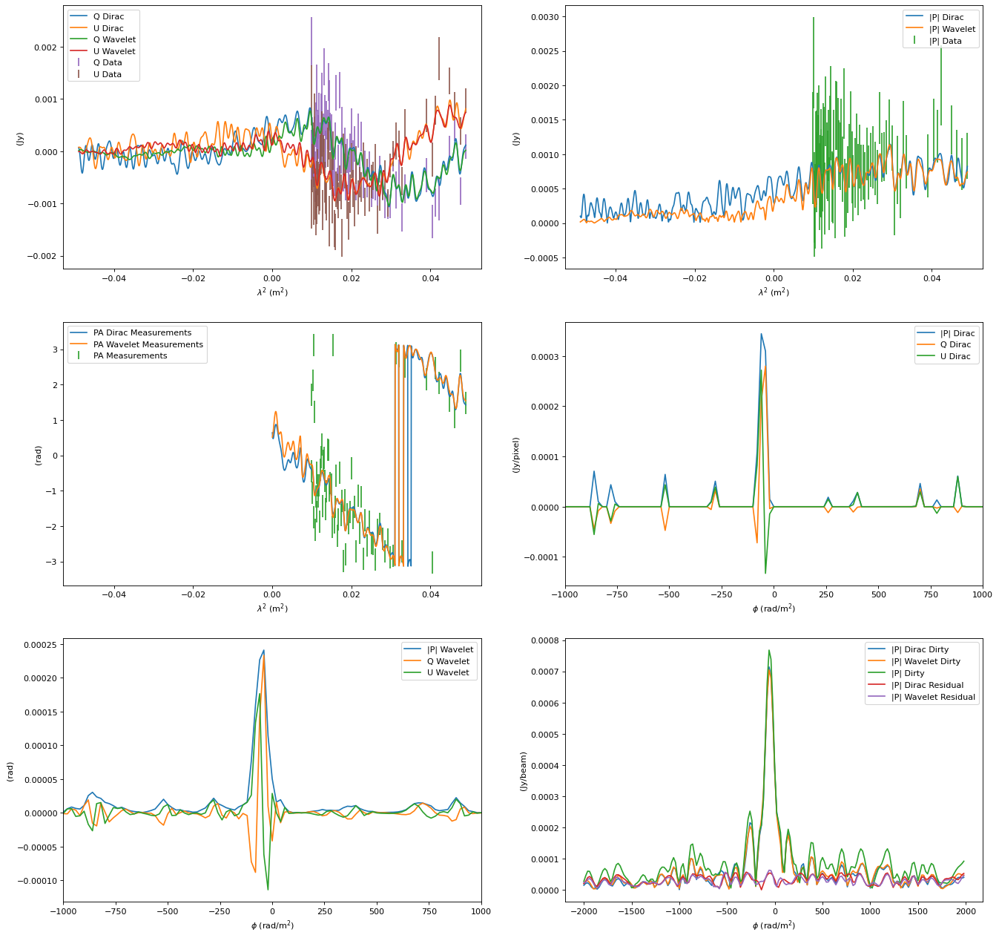

In [24]:
source = sources[18]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1437'
135
2021-09-12 15:20:52,672 - Faraday Dreams - INFO - φ resolution 31.3353417596067 rad/m^2.
2021-09-12 15:20:52,672 - Faraday Dreams - INFO - φ max range is 265064.9966724824 rad/m^2.
2021-09-12 15:20:52,673 - Faraday Dreams - INFO - φ min range is 667.7041910331835 rad/m^2.
2021-09-12 15:20:52,694 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:20:52,695 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:20:52,697 - Optimus Primal - INFO - [Power Method] Converged with norm= 266.8336468381675, iter = 8, tol = 6.913597951647002e-05
2021-09-12 15:20:52,698 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:20:52,698 - Faraday Dreams - INFO - Using an estimated noise level of 0.00011951258056797087 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:20:52,699 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:20:52,700 - Optimus Primal - INFO - Running For

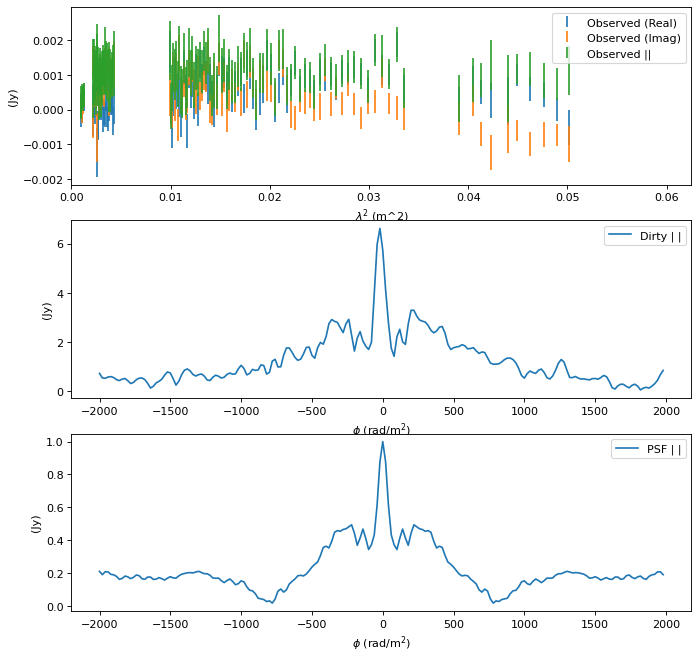

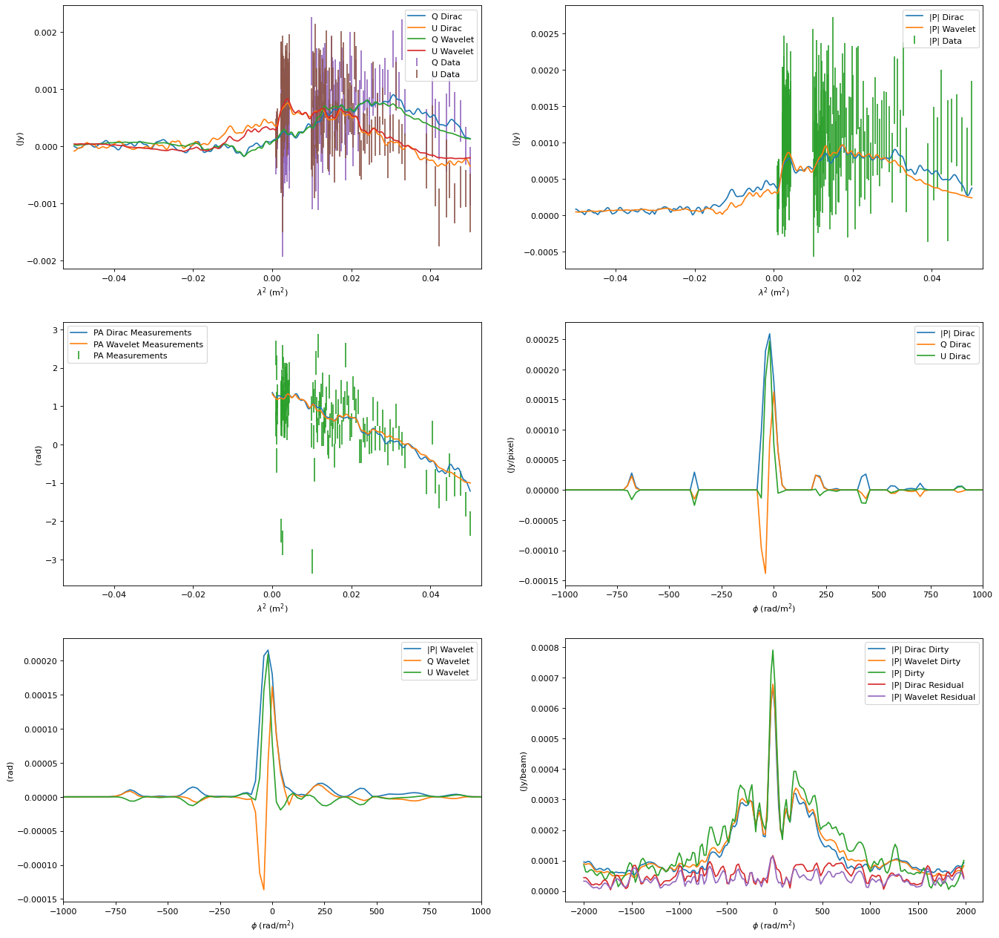

In [25]:
source = sources[19]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1.2
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1443'
127
2021-09-12 15:21:17,984 - Faraday Dreams - INFO - φ resolution 31.335388563999047 rad/m^2.
2021-09-12 15:21:17,985 - Faraday Dreams - INFO - φ max range is 73192.09867324268 rad/m^2.
2021-09-12 15:21:17,986 - Faraday Dreams - INFO - φ min range is 667.7056871310253 rad/m^2.
2021-09-12 15:21:18,006 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:21:18,008 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:21:18,010 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:21:18,011 - Optimus Primal - INFO - [Power Method] Converged with norm= 125.34036327120616, iter = 16, tol = 6.744426442132442e-05
2021-09-12 15:21:18,012 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:21:18,013 - Faraday Dreams - INFO - Using an estimated noise level of 8.084181899903342e-05 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:21:18,013 - Faraday Dreams - INFO - Reconstructing Faraday Depth using co

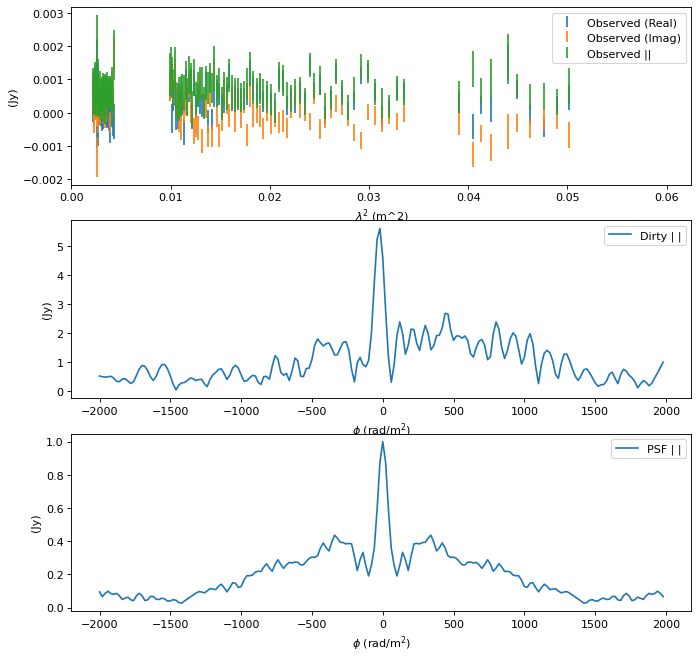

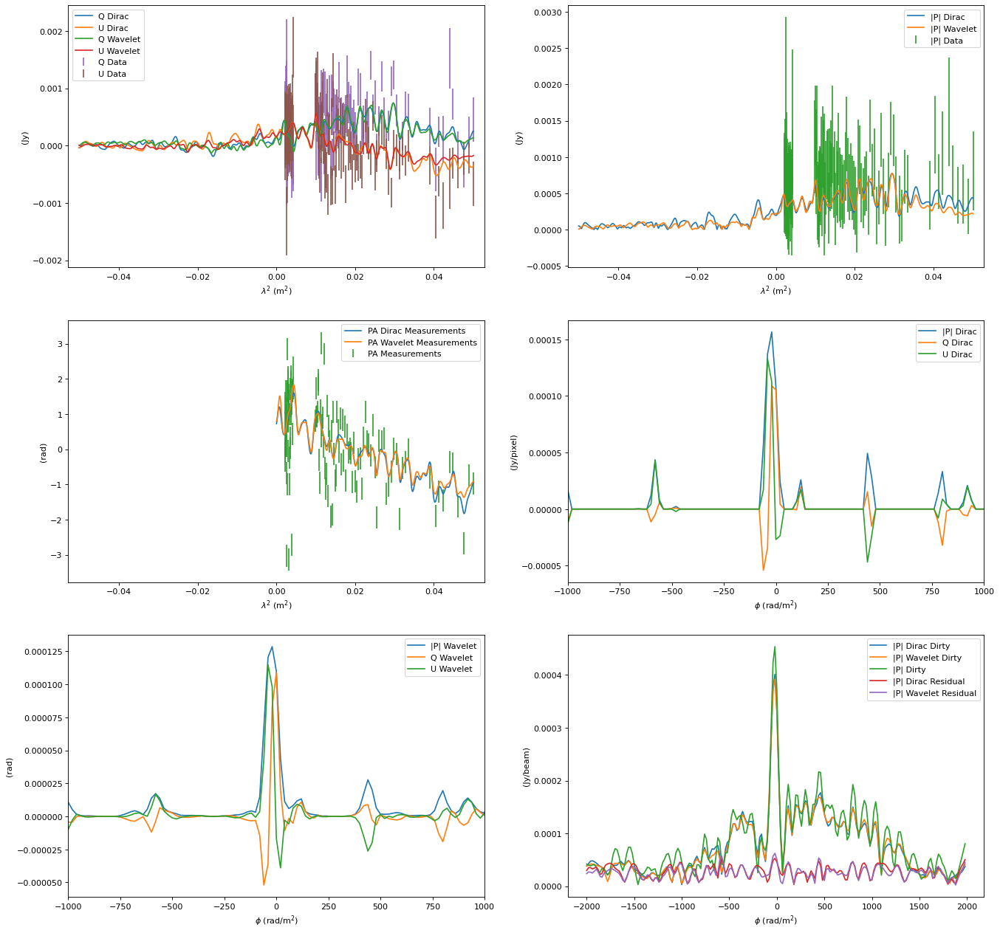

In [26]:
source = sources[20]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1568'
139
2021-09-12 15:21:43,455 - Faraday Dreams - INFO - φ resolution 29.546143222760847 rad/m^2.
2021-09-12 15:21:43,455 - Faraday Dreams - INFO - φ max range is 264969.6543038113 rad/m^2.
2021-09-12 15:21:43,456 - Faraday Dreams - INFO - φ min range is 611.3370442280756 rad/m^2.
2021-09-12 15:21:43,479 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:21:43,480 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:21:43,483 - Optimus Primal - INFO - [Power Method] Converged with norm= 1721.5876341275148, iter = 11, tol = 6.42595158020314e-05
2021-09-12 15:21:43,483 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:21:43,484 - Faraday Dreams - INFO - Using an estimated noise level of 0.00029783096397295594 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:21:43,485 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:21:43,486 - Optimus Primal - INFO - Running 

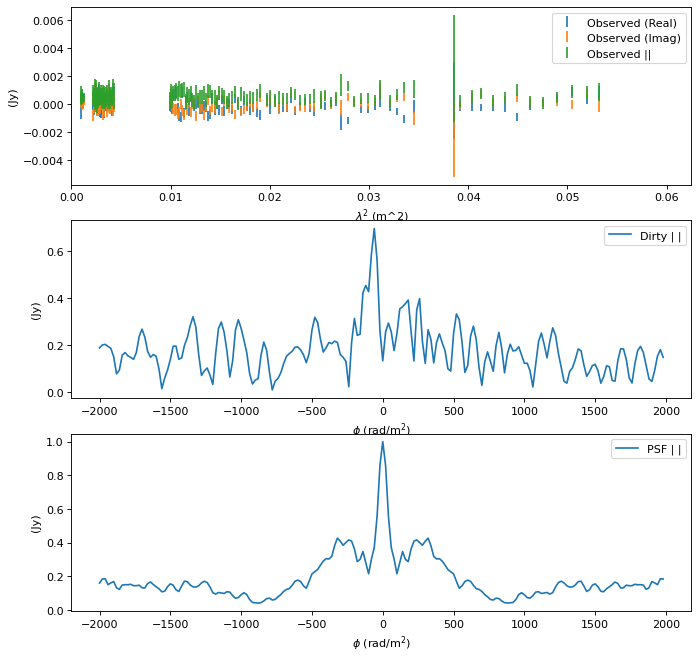

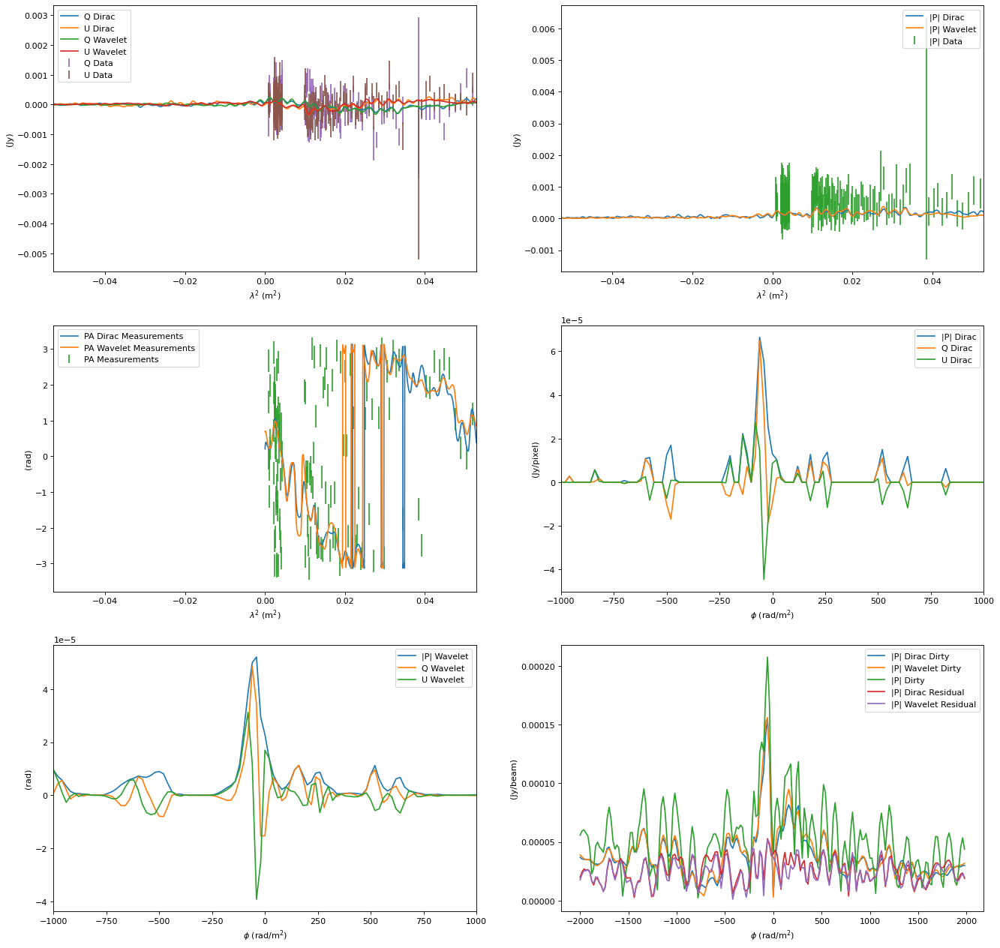

In [27]:
source = sources[21]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1605'
130
2021-09-12 15:22:12,177 - Faraday Dreams - INFO - φ resolution 29.55673367395871 rad/m^2.
2021-09-12 15:22:12,177 - Faraday Dreams - INFO - φ max range is 73207.34813320827 rad/m^2.
2021-09-12 15:22:12,178 - Faraday Dreams - INFO - φ min range is 611.6657889631293 rad/m^2.
2021-09-12 15:22:12,199 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:22:12,200 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:22:12,203 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:22:12,205 - Optimus Primal - INFO - [Power Method] Converged with norm= 1606.6625192531335, iter = 14, tol = 6.952210353599358e-05
2021-09-12 15:22:12,206 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:22:12,206 - Faraday Dreams - INFO - Using an estimated noise level of 0.0003159504267387092 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:22:12,207 - Faraday Dreams - INFO - Reconstructing Faraday Depth using con

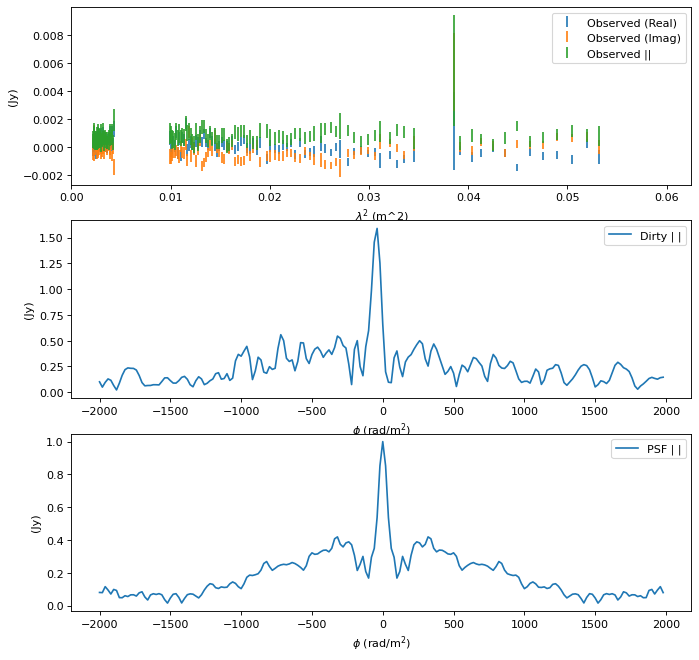

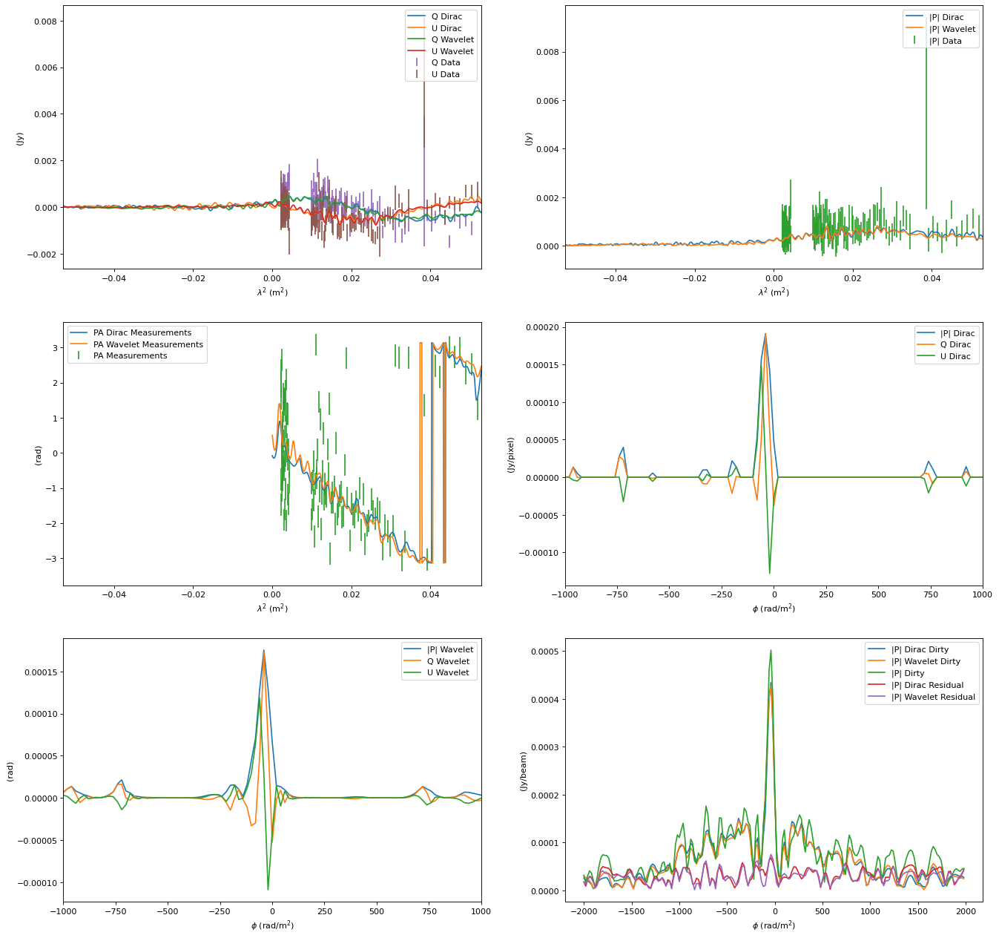

In [28]:
source = sources[22]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1681'
119
2021-09-12 15:22:35,185 - Faraday Dreams - INFO - φ resolution 31.131233710152113 rad/m^2.
2021-09-12 15:22:35,185 - Faraday Dreams - INFO - φ max range is 69402.92639958319 rad/m^2.
2021-09-12 15:22:35,186 - Faraday Dreams - INFO - φ min range is 661.1905361678431 rad/m^2.
2021-09-12 15:22:35,202 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:22:35,203 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:22:35,205 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:22:35,207 - Optimus Primal - INFO - [Power Method] Converged with norm= 143.97718238962, iter = 15, tol = 8.142365096979156e-05
2021-09-12 15:22:35,207 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:22:35,208 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010935687168966979 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:22:35,208 - Faraday Dreams - INFO - Reconstructing Faraday Depth using cons

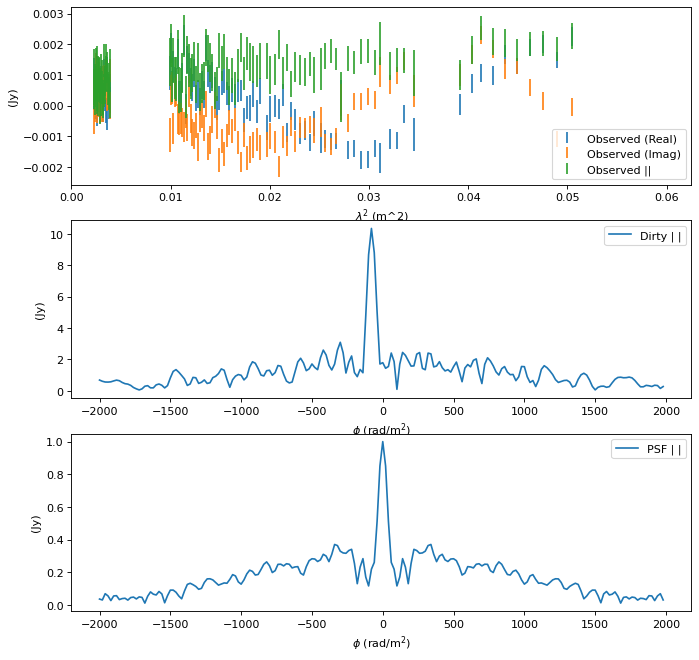

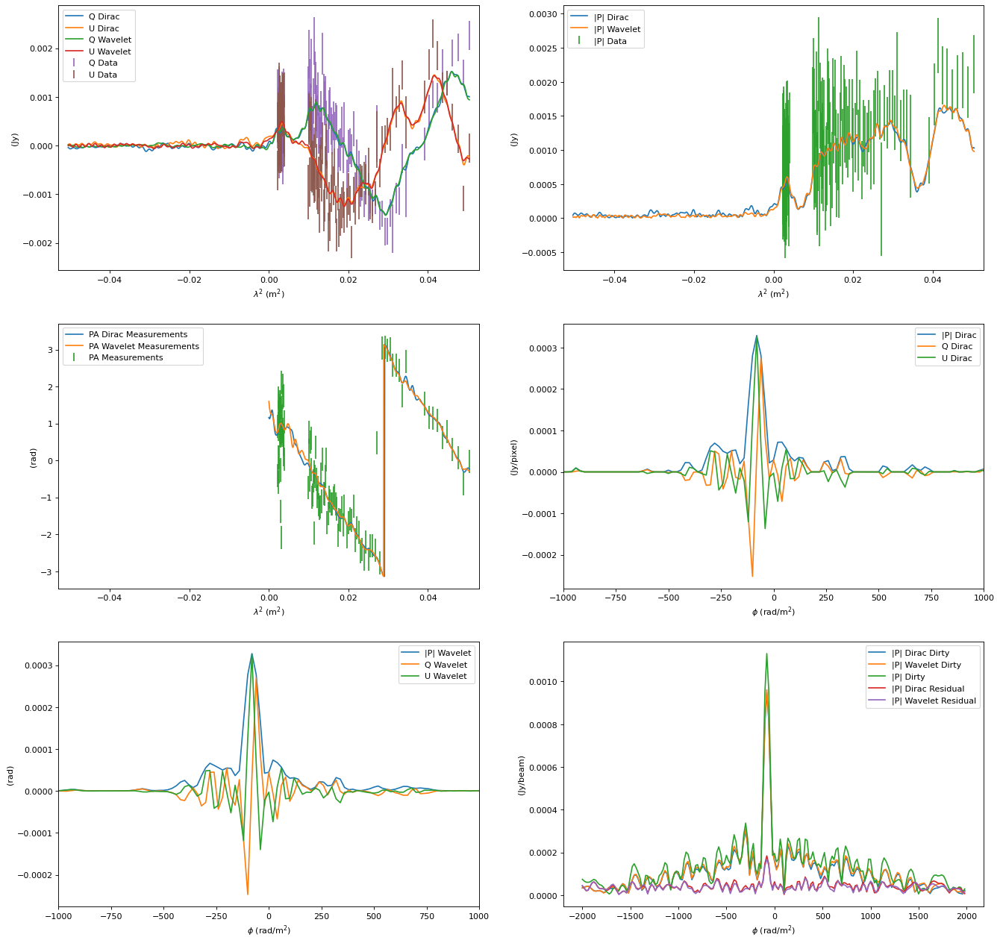

In [29]:
source = sources[23]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-4, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'cena_s1803'
129
2021-09-12 15:23:01,088 - Faraday Dreams - INFO - φ resolution 37.99642129833886 rad/m^2.
2021-09-12 15:23:01,088 - Faraday Dreams - INFO - φ max range is 265064.1077821222 rad/m^2.
2021-09-12 15:23:01,089 - Faraday Dreams - INFO - φ min range is 891.5690495126719 rad/m^2.
2021-09-12 15:23:01,112 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:23:01,113 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:23:01,114 - Optimus Primal - INFO - [Power Method] Converged with norm= 546.7346997924244, iter = 5, tol = 1.7298358298980843e-05
2021-09-12 15:23:01,115 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:23:01,115 - Faraday Dreams - INFO - Using an estimated noise level of 0.00025035356520675123 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:23:01,116 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:23:01,116 - Optimus Primal - INFO - Running F

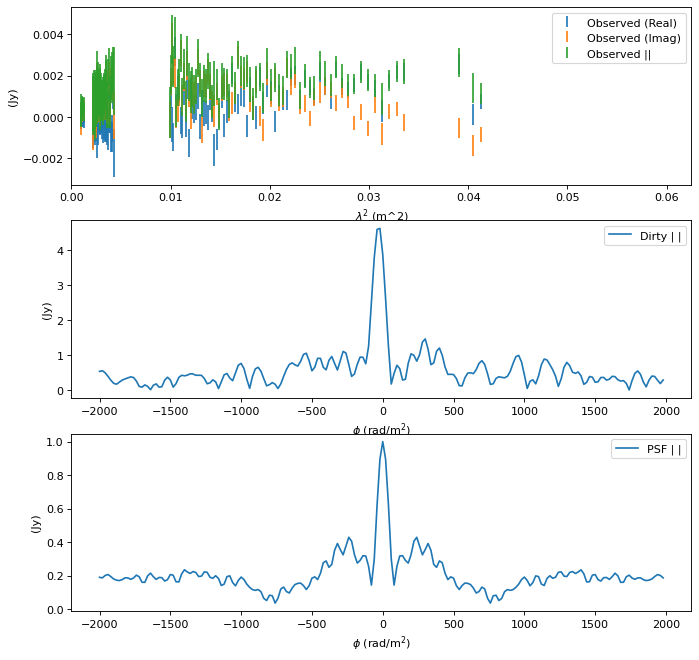

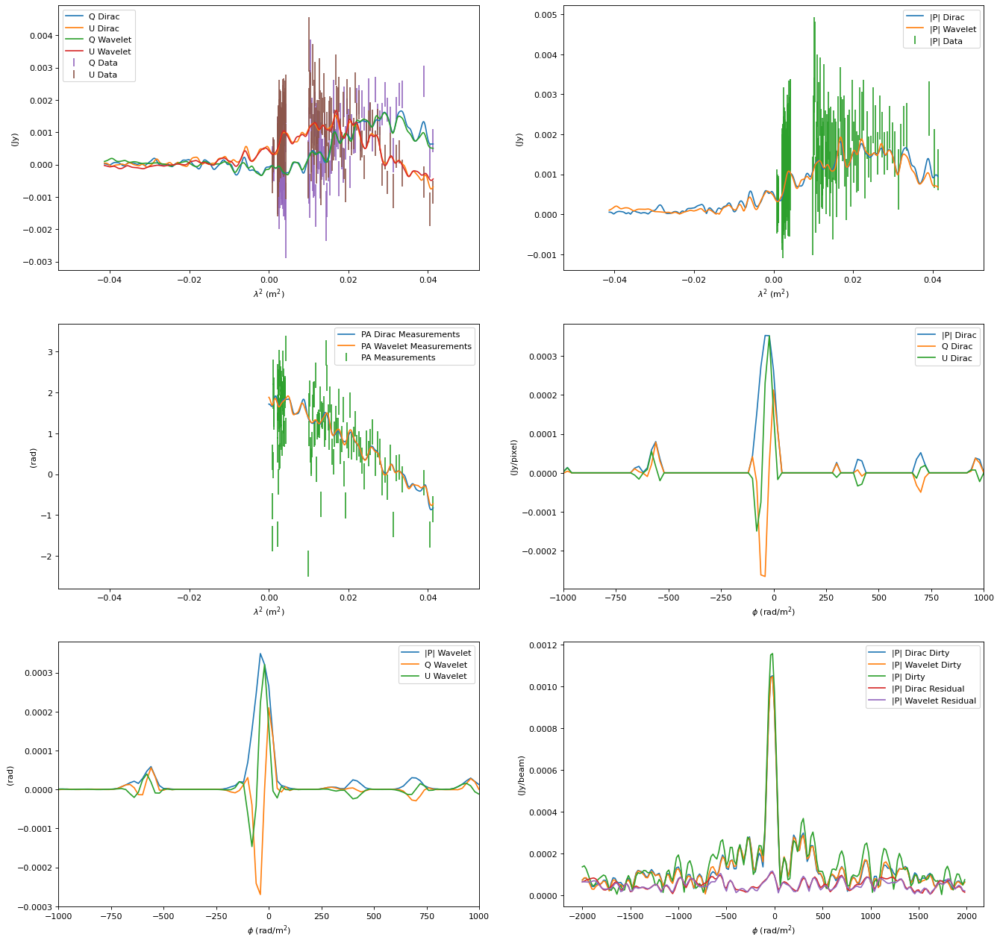

In [30]:
source = sources[24]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.5
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c01'
136
2021-09-12 15:23:21,915 - Faraday Dreams - INFO - φ resolution 31.400527314886236 rad/m^2.
2021-09-12 15:23:21,916 - Faraday Dreams - INFO - φ max range is 265121.56651130295 rad/m^2.
2021-09-12 15:23:21,916 - Faraday Dreams - INFO - φ min range is 669.7889235182341 rad/m^2.
2021-09-12 15:23:21,934 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:23:21,936 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:23:21,937 - Optimus Primal - INFO - [Power Method] Converged with norm= 704.8349404913066, iter = 4, tol = 3.9714756226451305e-05
2021-09-12 15:23:21,937 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:23:21,938 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012347025040071458 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:23:21,939 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:23:21,939 - Optimus Primal - INFO - Running Fo

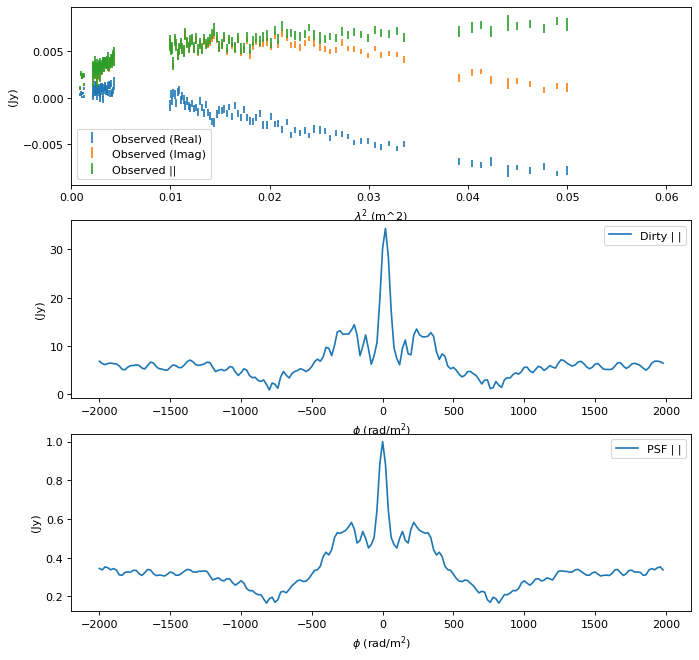

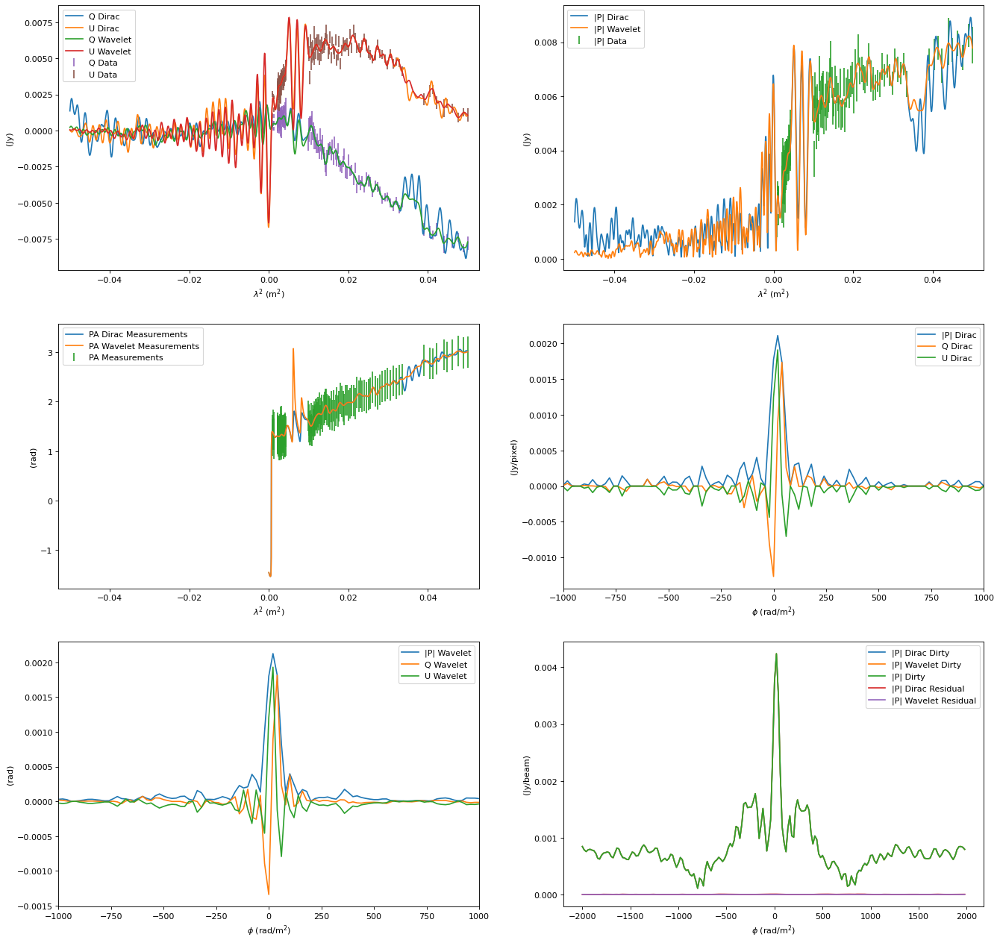

In [31]:
source = sources[25]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c02'
135
2021-09-12 15:23:51,073 - Faraday Dreams - INFO - φ resolution 31.383896691074796 rad/m^2.
2021-09-12 15:23:51,074 - Faraday Dreams - INFO - φ max range is 264992.0334670015 rad/m^2.
2021-09-12 15:23:51,074 - Faraday Dreams - INFO - φ min range is 669.2568452359088 rad/m^2.
2021-09-12 15:23:51,097 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:23:51,098 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:23:51,100 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:23:51,103 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:23:51,105 - Optimus Primal - INFO - [Power Method] Converged with norm= 382.63721152085026, iter = 30, tol = 9.36583540906238e-05
2021-09-12 15:23:51,106 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:23:51,106 - Faraday Dreams - INFO - Using an estimated noise level of 0.00015441694995388389 (weighted image units, i.e. Jy/Beam)
2021

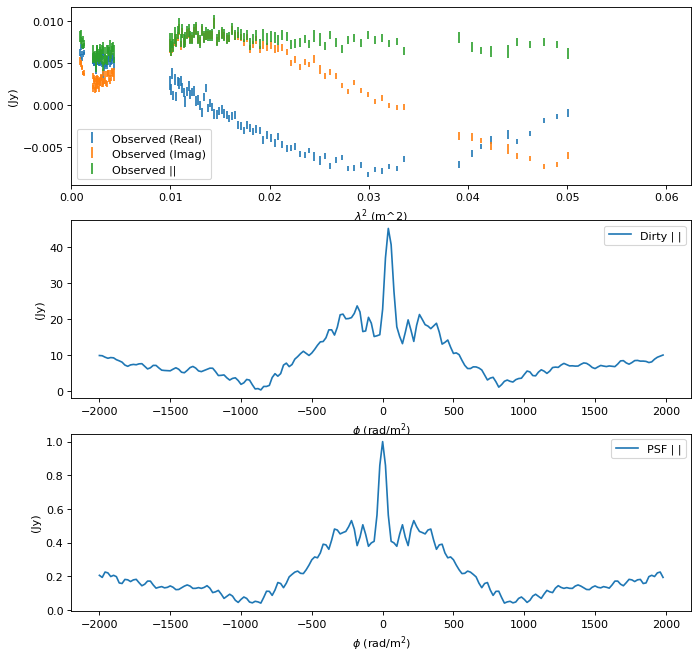

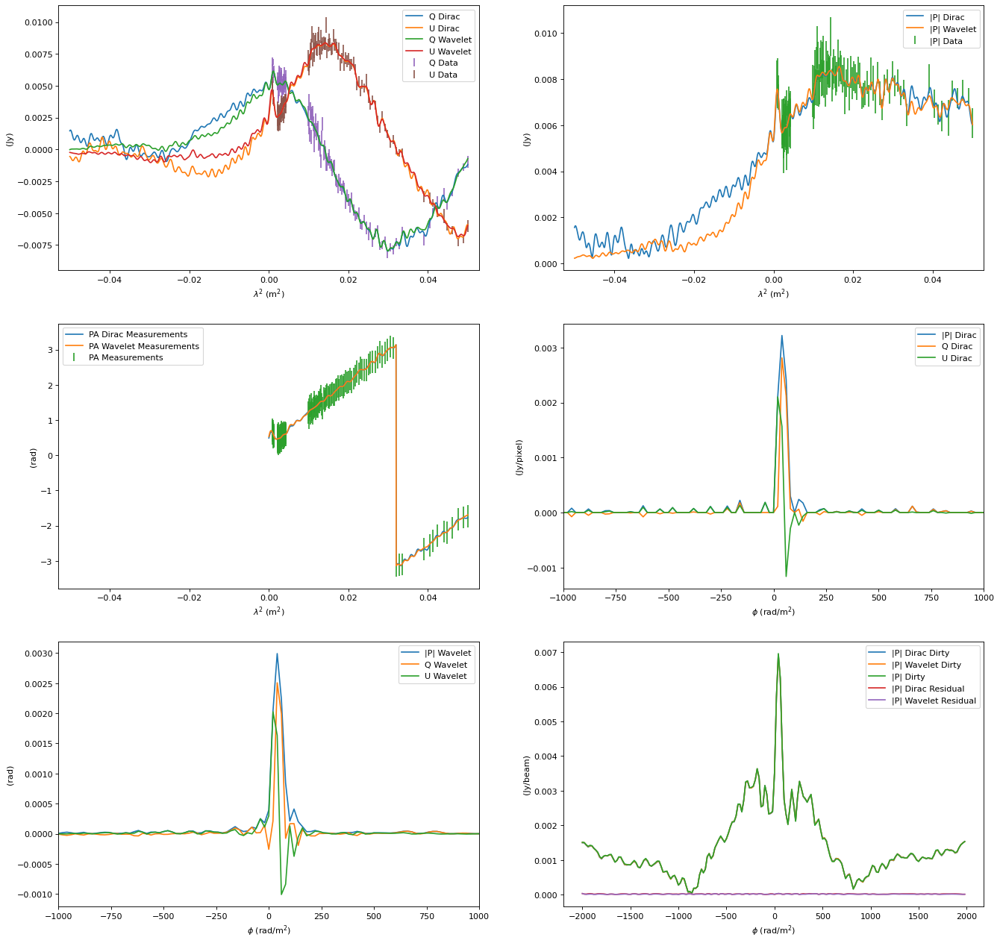

In [32]:
source = sources[26]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c03'
135
2021-09-12 15:24:17,030 - Faraday Dreams - INFO - φ resolution 32.06609750268784 rad/m^2.
2021-09-12 15:24:17,030 - Faraday Dreams - INFO - φ max range is 265067.0168852999 rad/m^2.
2021-09-12 15:24:17,031 - Faraday Dreams - INFO - φ min range is 691.1983869110167 rad/m^2.
2021-09-12 15:24:17,051 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:24:17,052 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:24:17,054 - Optimus Primal - INFO - [Power Method] Converged with norm= 1097.0914028656432, iter = 6, tol = 4.492880118191722e-05
2021-09-12 15:24:17,055 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:24:17,055 - Faraday Dreams - INFO - Using an estimated noise level of 0.00021976992138661444 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:24:17,056 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:24:17,057 - Optimus Primal - INFO - Running Forw

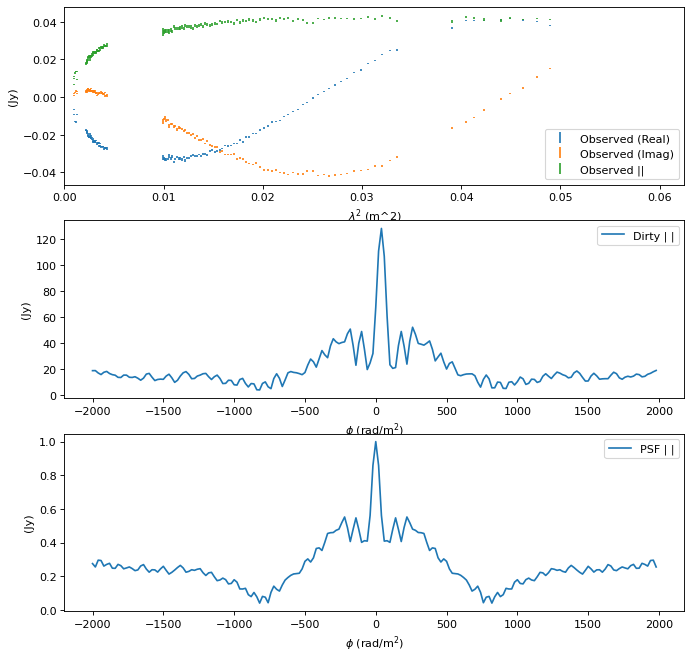

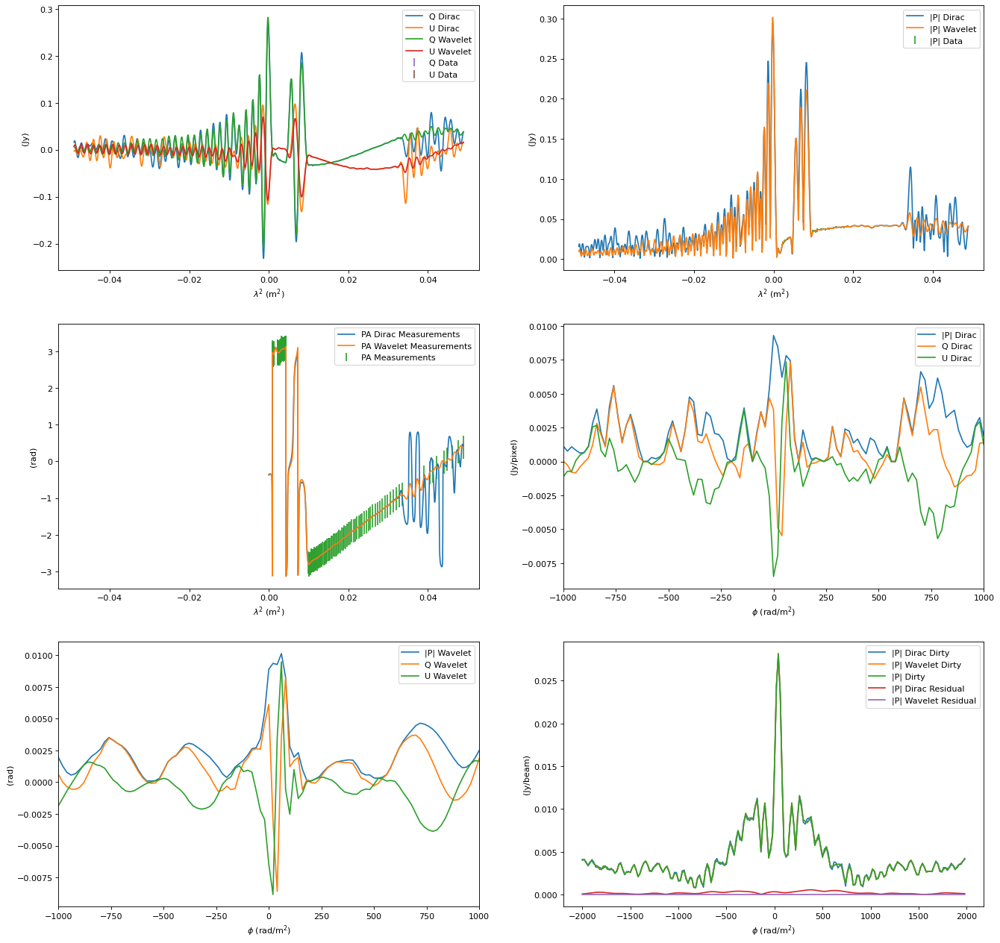

In [33]:
source = sources[27]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c04'
225
2021-09-12 15:25:08,527 - Faraday Dreams - INFO - φ resolution 31.102129859819943 rad/m^2.
2021-09-12 15:25:08,528 - Faraday Dreams - INFO - φ max range is 251840.3715191047 rad/m^2.
2021-09-12 15:25:08,529 - Faraday Dreams - INFO - φ min range is 660.2634865571416 rad/m^2.
2021-09-12 15:25:08,562 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:25:08,563 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:25:08,566 - Optimus Primal - INFO - [Power Method] Converged with norm= 3796.522800462902, iter = 11, tol = 8.752647107973562e-05
2021-09-12 15:25:08,566 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:25:08,567 - Faraday Dreams - INFO - Using an estimated noise level of 0.00025056363665498793 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:25:08,568 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:25:08,568 - Optimus Primal - INFO - Running For

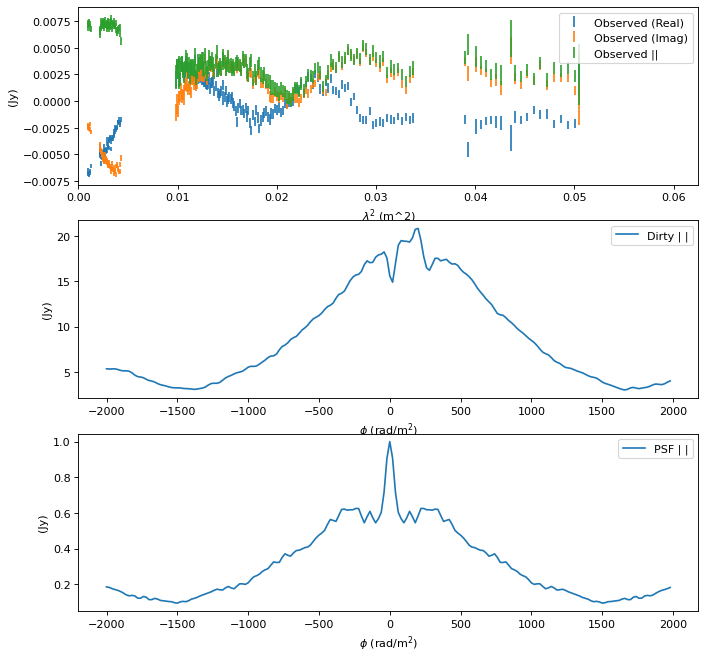

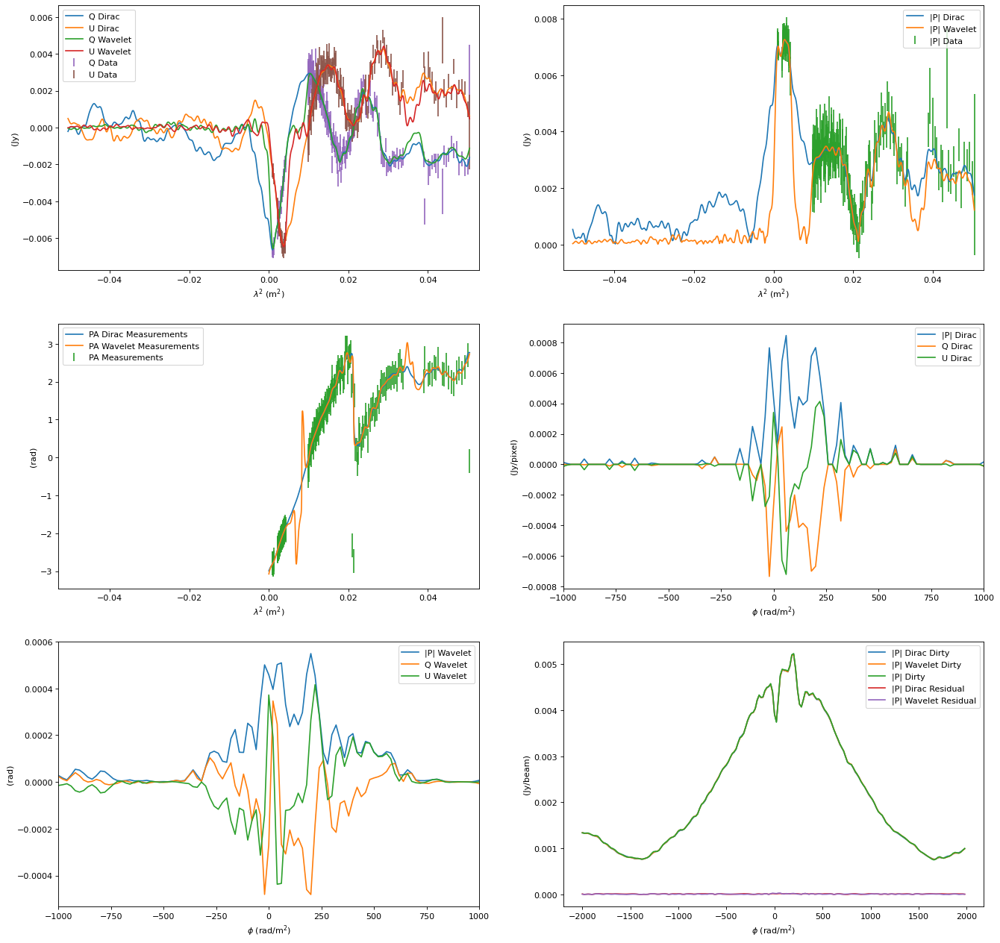

In [34]:
source = sources[28]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
beta1, beta2 = 1e-3, 1e-4
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c06'
129
2021-09-12 15:25:37,041 - Faraday Dreams - INFO - φ resolution 31.102129859819943 rad/m^2.
2021-09-12 15:25:37,041 - Faraday Dreams - INFO - φ max range is 73187.02741205381 rad/m^2.
2021-09-12 15:25:37,042 - Faraday Dreams - INFO - φ min range is 660.2634865571416 rad/m^2.
2021-09-12 15:25:37,063 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:25:37,064 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:25:37,067 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:25:37,069 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:25:37,071 - Optimus Primal - INFO - [Power Method] Converged with norm= 786.737323625821, iter = 27, tol = 8.574306216304032e-05
2021-09-12 15:25:37,072 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:25:37,073 - Faraday Dreams - INFO - Using an estimated noise level of 0.0002332130097784102 (weighted image units, i.e. Jy/Beam)
2021-0

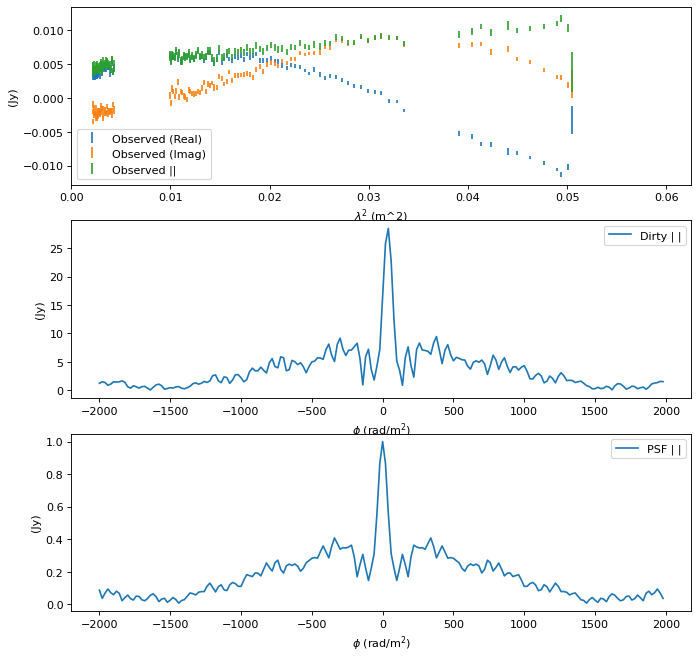

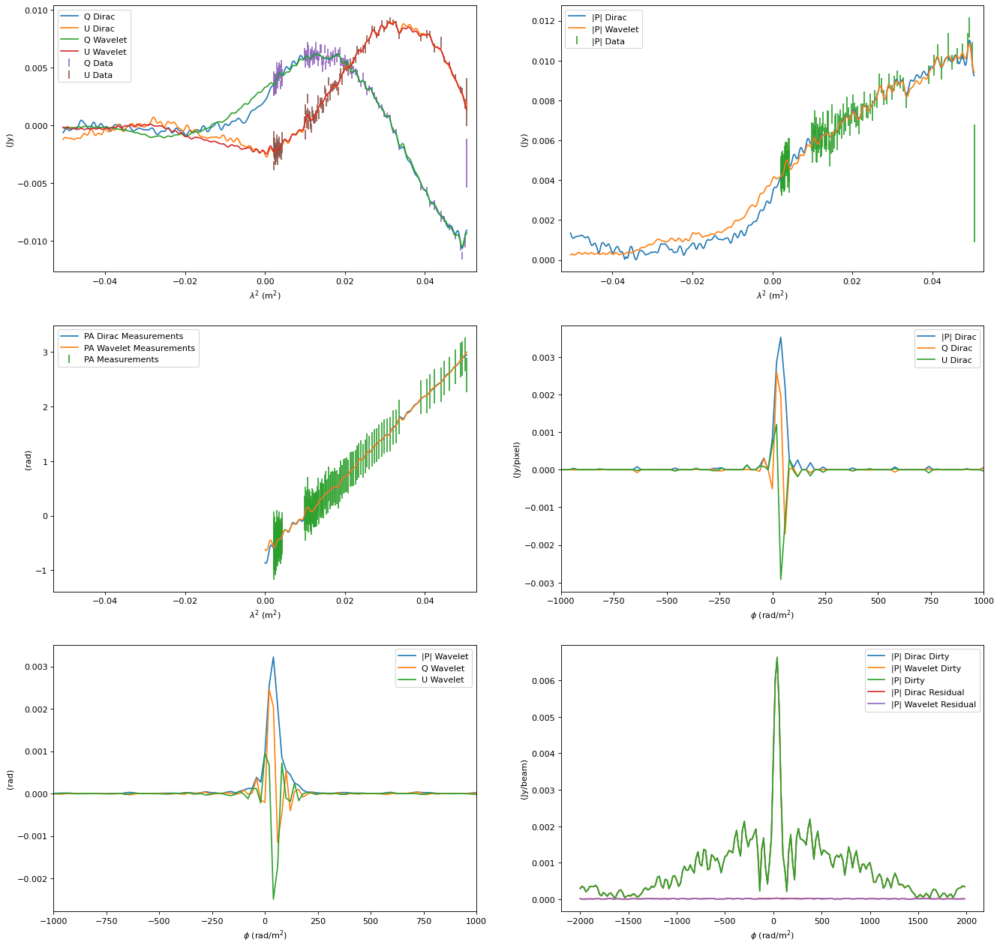

In [35]:
source = sources[29]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c07'
135
2021-09-12 15:26:06,220 - Faraday Dreams - INFO - φ resolution 31.387128777281486 rad/m^2.
2021-09-12 15:26:06,220 - Faraday Dreams - INFO - φ max range is 265167.07066406147 rad/m^2.
2021-09-12 15:26:06,221 - Faraday Dreams - INFO - φ min range is 669.3602411986252 rad/m^2.
2021-09-12 15:26:06,244 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:26:06,245 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:26:06,247 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:26:06,248 - Optimus Primal - INFO - [Power Method] Converged with norm= 449.2907790692485, iter = 13, tol = 7.777791777720896e-05
2021-09-12 15:26:06,249 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:26:06,250 - Faraday Dreams - INFO - Using an estimated noise level of 0.00012698714854195715 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:26:06,251 - Faraday Dreams - INFO - Reconstructing Faraday Depth using cons

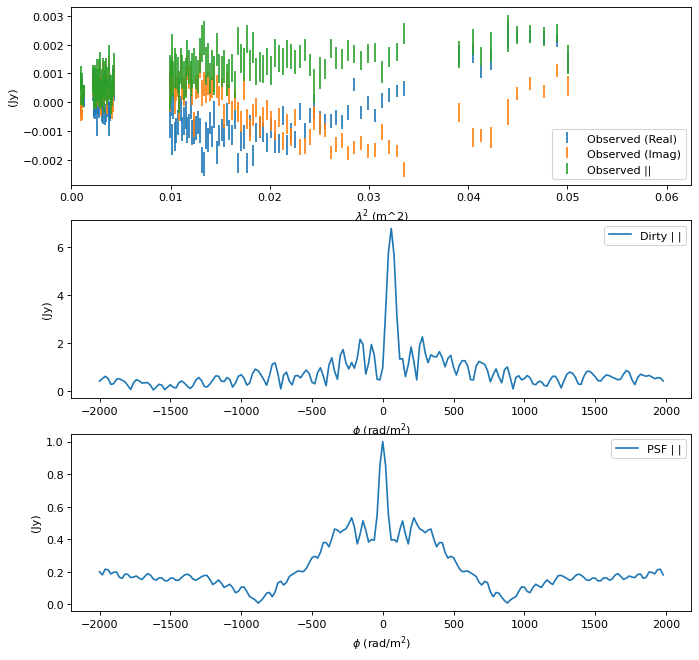

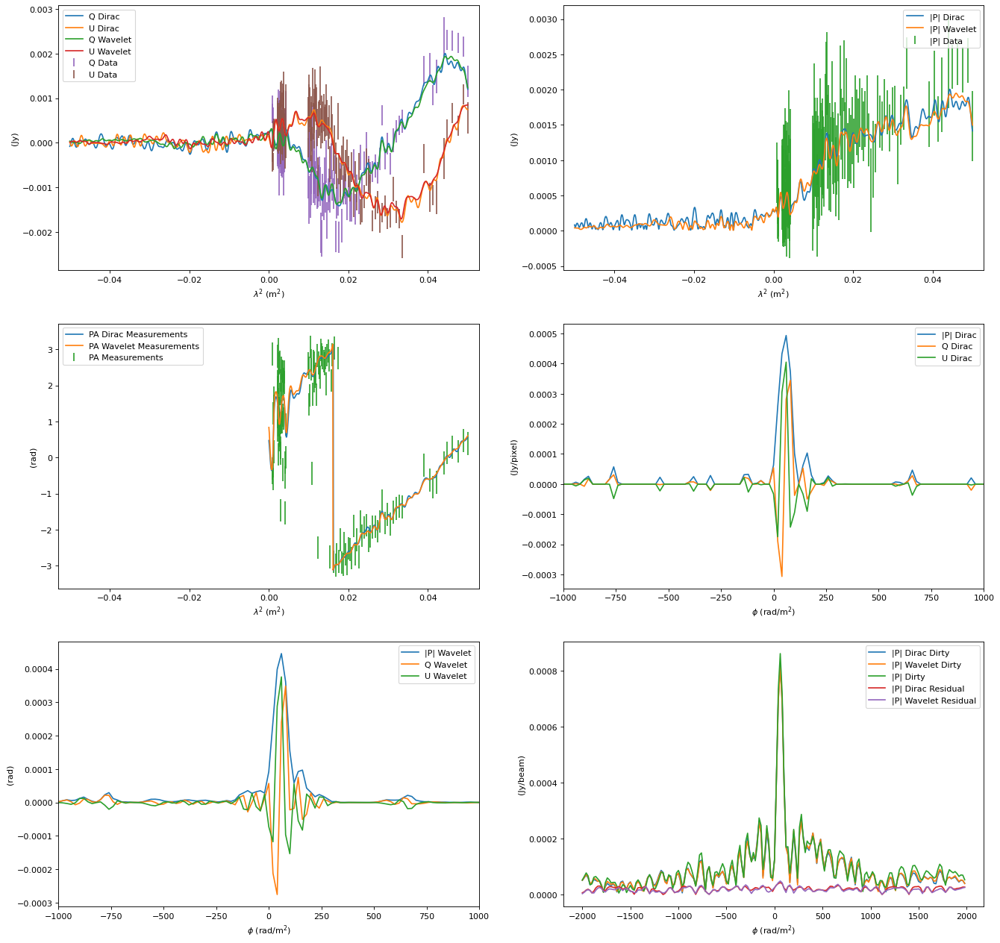

In [36]:
source = sources[30]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c15'
136
2021-09-12 15:26:35,592 - Faraday Dreams - INFO - φ resolution 31.374341931297003 rad/m^2.
2021-09-12 15:26:35,593 - Faraday Dreams - INFO - φ max range is 265073.40082525415 rad/m^2.
2021-09-12 15:26:35,593 - Faraday Dreams - INFO - φ min range is 668.9512150992091 rad/m^2.
2021-09-12 15:26:35,612 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:26:35,614 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:26:35,615 - Optimus Primal - INFO - [Power Method] Converged with norm= 1146.0710778602881, iter = 4, tol = 7.939159325169643e-06
2021-09-12 15:26:35,616 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:26:35,616 - Faraday Dreams - INFO - Using an estimated noise level of 0.00023795454762876034 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:26:35,617 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:26:35,618 - Optimus Primal - INFO - Running Fo

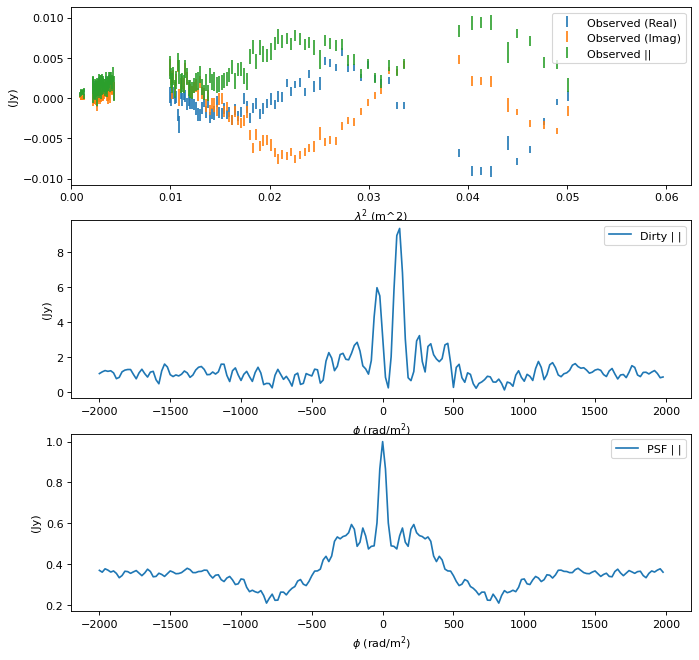

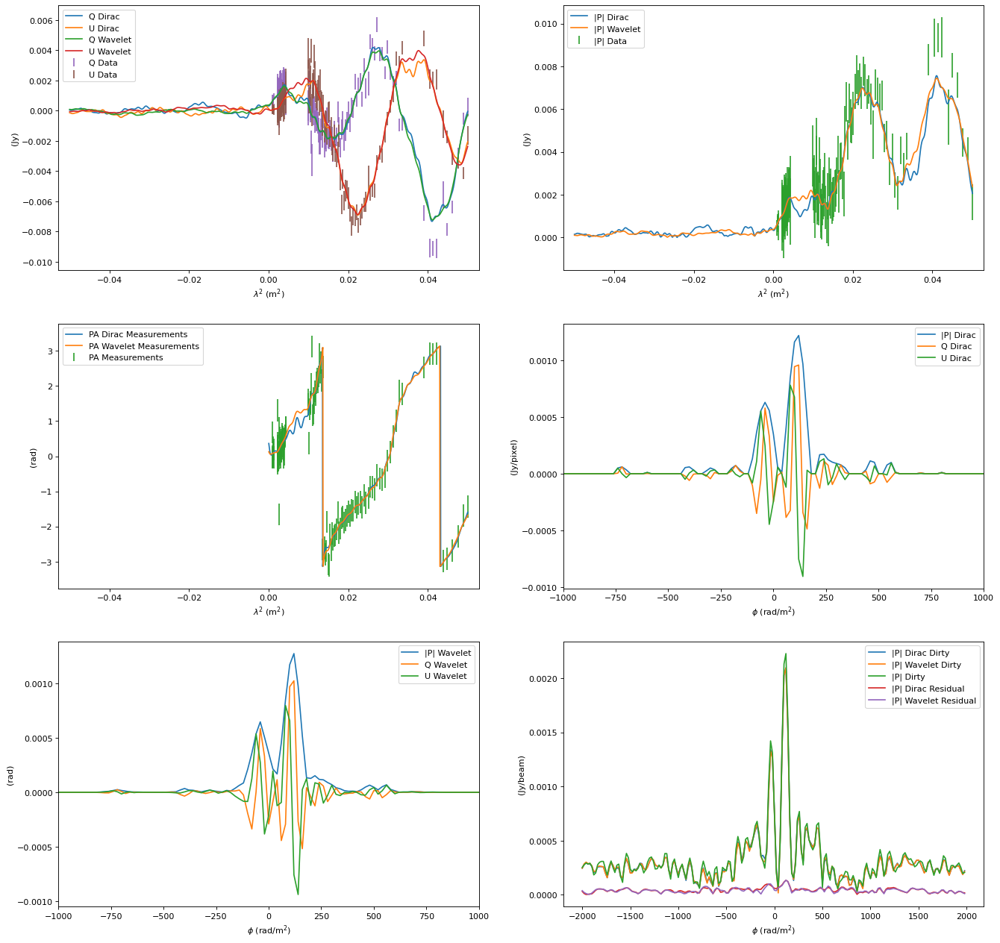

In [37]:
source = sources[31]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 0.6
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_c16'
131
2021-09-12 15:27:07,406 - Faraday Dreams - INFO - φ resolution 32.065434648389385 rad/m^2.
2021-09-12 15:27:07,407 - Faraday Dreams - INFO - φ max range is 265156.15889180586 rad/m^2.
2021-09-12 15:27:07,407 - Faraday Dreams - INFO - φ min range is 691.1769533041646 rad/m^2.
2021-09-12 15:27:07,429 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:27:07,430 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:27:07,431 - Optimus Primal - INFO - [Power Method] Converged with norm= 1550.2795433490153, iter = 4, tol = 9.025584381720725e-05
2021-09-12 15:27:07,432 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:27:07,432 - Faraday Dreams - INFO - Using an estimated noise level of 0.00019796362903434783 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:27:07,433 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrained l1 regularization
2021-09-12 15:27:07,434 - Optimus Primal - INFO - Running Fo

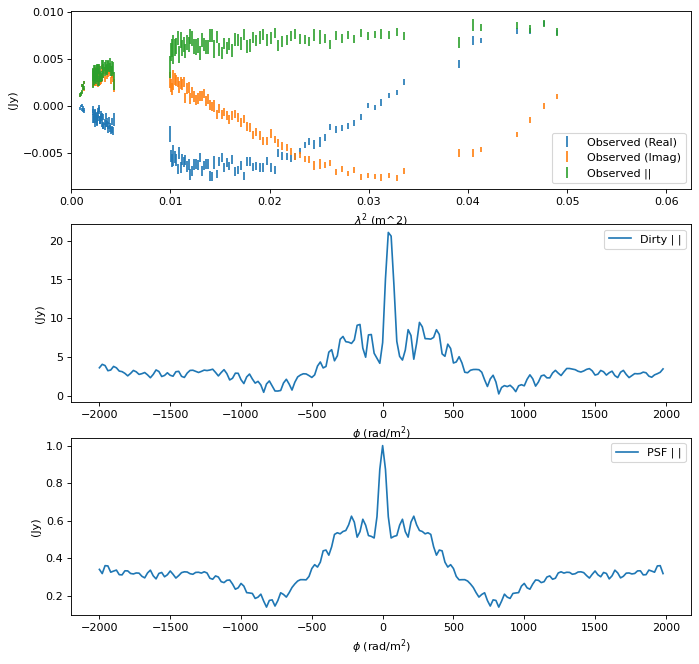

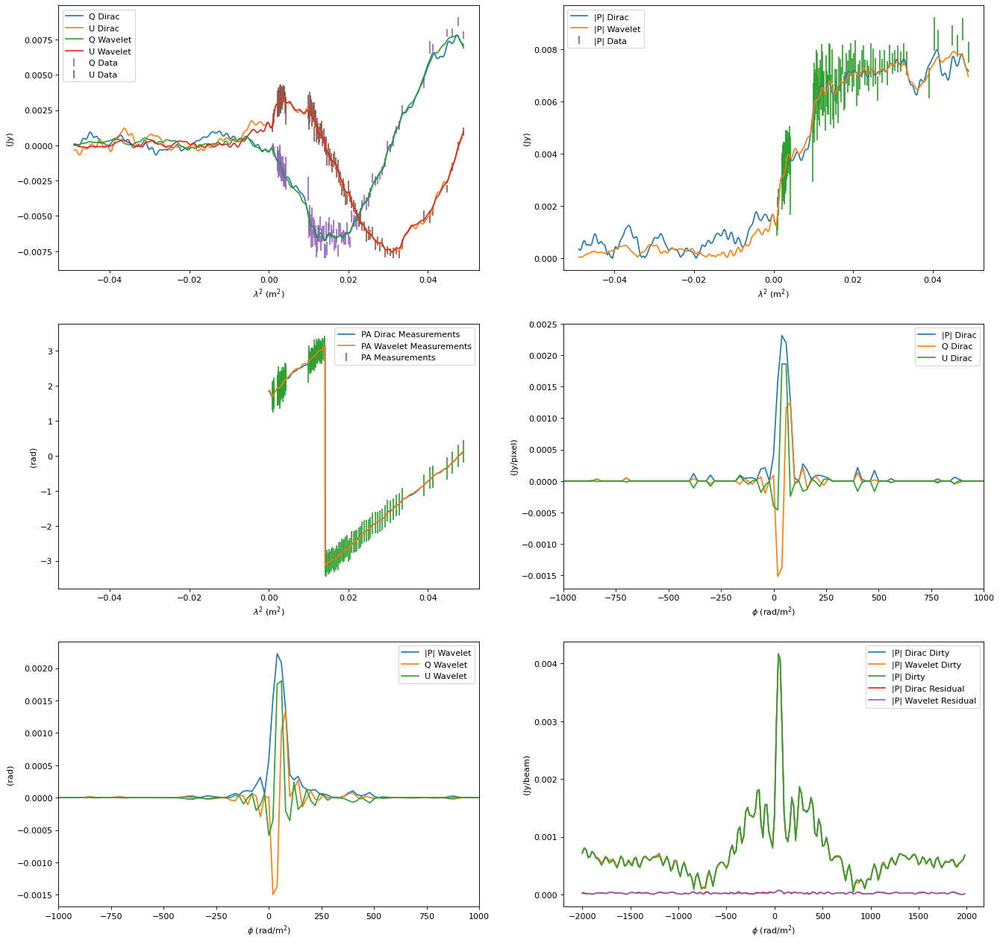

In [38]:
source = sources[32]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s11'
172
2021-09-12 15:27:42,375 - Faraday Dreams - INFO - φ resolution 31.38506771757665 rad/m^2.
2021-09-12 15:27:42,376 - Faraday Dreams - INFO - φ max range is 265002.45596219285 rad/m^2.
2021-09-12 15:27:42,377 - Faraday Dreams - INFO - φ min range is 669.2943063111551 rad/m^2.
2021-09-12 15:27:42,406 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:27:42,407 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:27:42,410 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:27:42,413 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:27:42,416 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2021-09-12 15:27:42,417 - Optimus Primal - INFO - [Power Method] Converged with norm= 379.30449025386065, iter = 33, tol = 8.400454910544409e-05
2021-09-12 15:27:42,418 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:27:42,419 - Faraday Dreams - INFO - Using an es

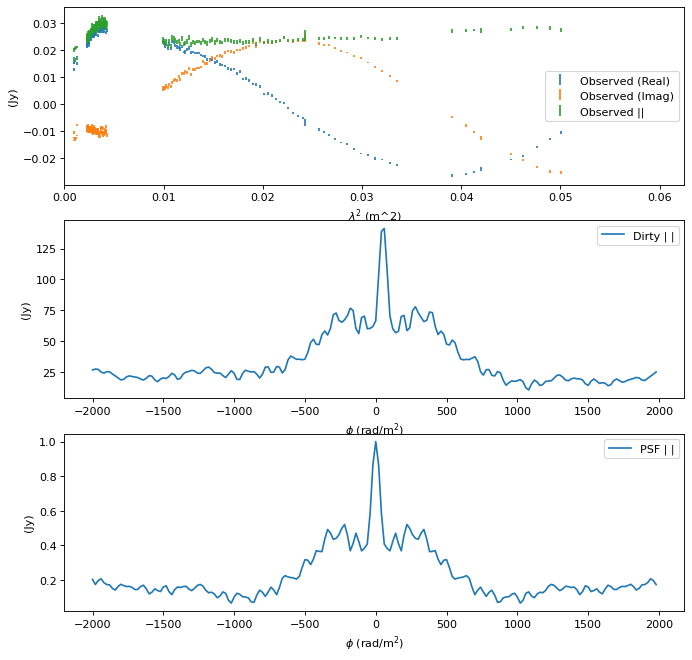

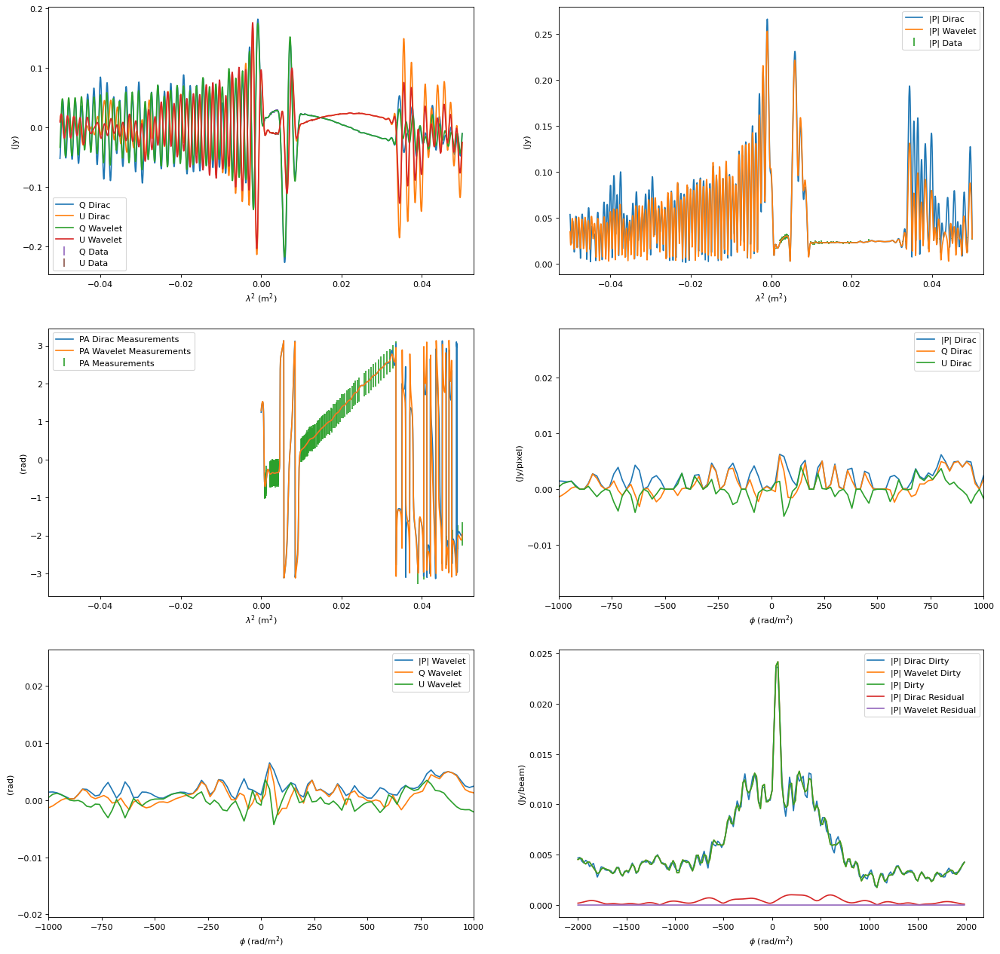

In [39]:
source = sources[33]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s13'
176
2021-09-12 15:28:53,576 - Faraday Dreams - INFO - φ resolution 31.41875578909573 rad/m^2.
2021-09-12 15:28:53,577 - Faraday Dreams - INFO - φ max range is 265002.37516661023 rad/m^2.
2021-09-12 15:28:53,578 - Faraday Dreams - INFO - φ min range is 670.372285134991 rad/m^2.
2021-09-12 15:28:53,604 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:28:53,605 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:28:53,607 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:28:53,610 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2021-09-12 15:28:53,613 - Optimus Primal - INFO - [Power Method] Converged with norm= 1451.962144802856, iter = 31, tol = 9.452625905268024e-05
2021-09-12 15:28:53,613 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:28:53,614 - Faraday Dreams - INFO - Using an estimated noise level of 0.00032676217961125076 (weighted image units, i.e. Jy/Beam)
2021-

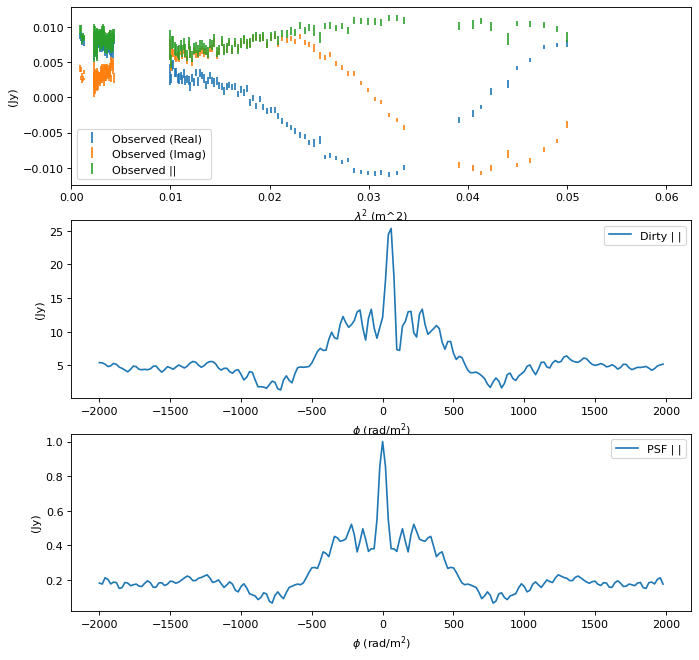

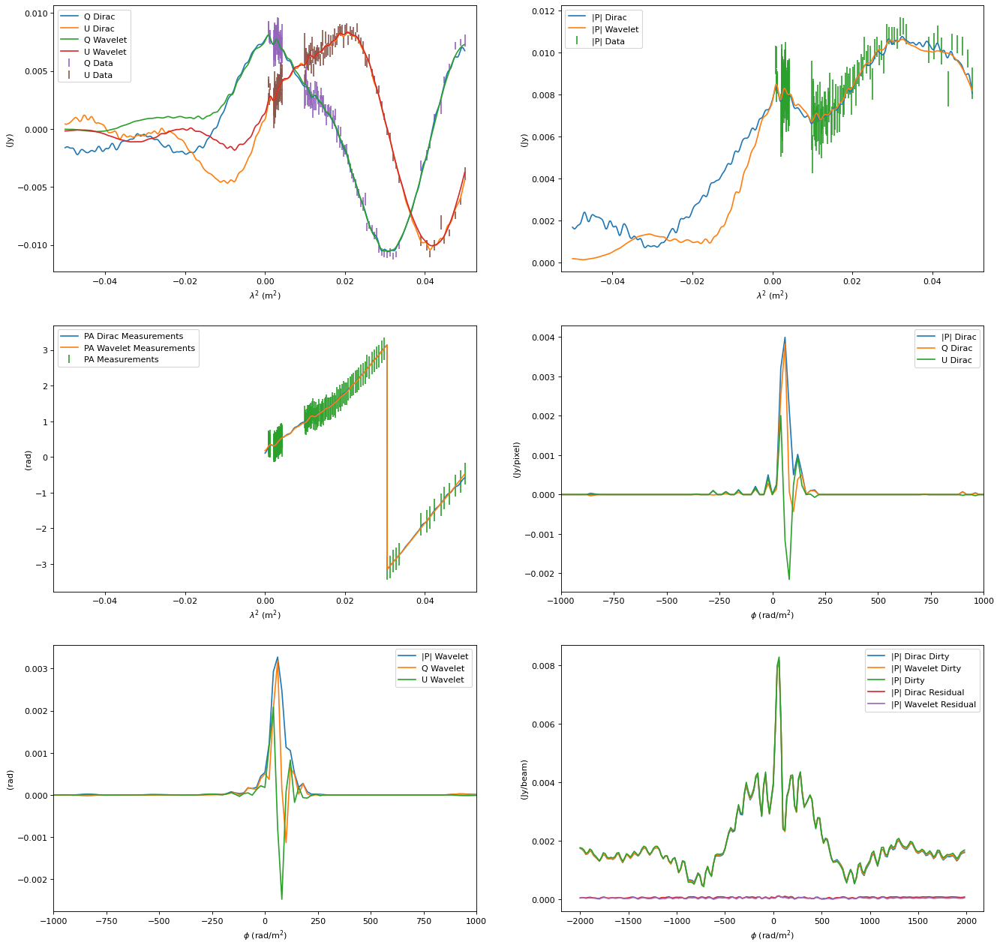

In [40]:
source = sources[34]
print(source)
wav = ['db8', 'db6', 'db4']
levels = 1
sig_factor = 1
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)

b'lmc_s14'
92
2021-09-12 15:29:20,441 - Faraday Dreams - INFO - φ resolution 31.985279846738194 rad/m^2.
2021-09-12 15:29:20,442 - Faraday Dreams - INFO - φ max range is 73192.749730496 rad/m^2.
2021-09-12 15:29:20,442 - Faraday Dreams - INFO - φ min range is 688.5867559191099 rad/m^2.
2021-09-12 15:29:20,458 - Optimus Primal - INFO - Starting Power method
2021-09-12 15:29:20,459 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2021-09-12 15:29:20,462 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2021-09-12 15:29:20,464 - Optimus Primal - INFO - [Power Method] Converged with norm= 185.7238166831613, iter = 20, tol = 6.831753801698637e-05
2021-09-12 15:29:20,465 - Faraday Dreams - INFO - Using wavelets ['dirac'] with 1 levels
2021-09-12 15:29:20,465 - Faraday Dreams - INFO - Using an estimated noise level of 0.00010616779327392578 (weighted image units, i.e. Jy/Beam)
2021-09-12 15:29:20,466 - Faraday Dreams - INFO - Reconstructing Faraday Depth using constrai

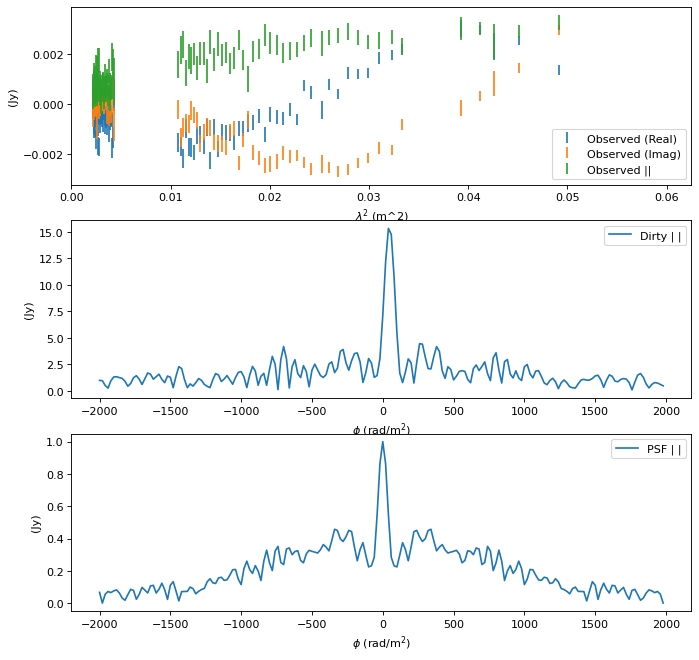

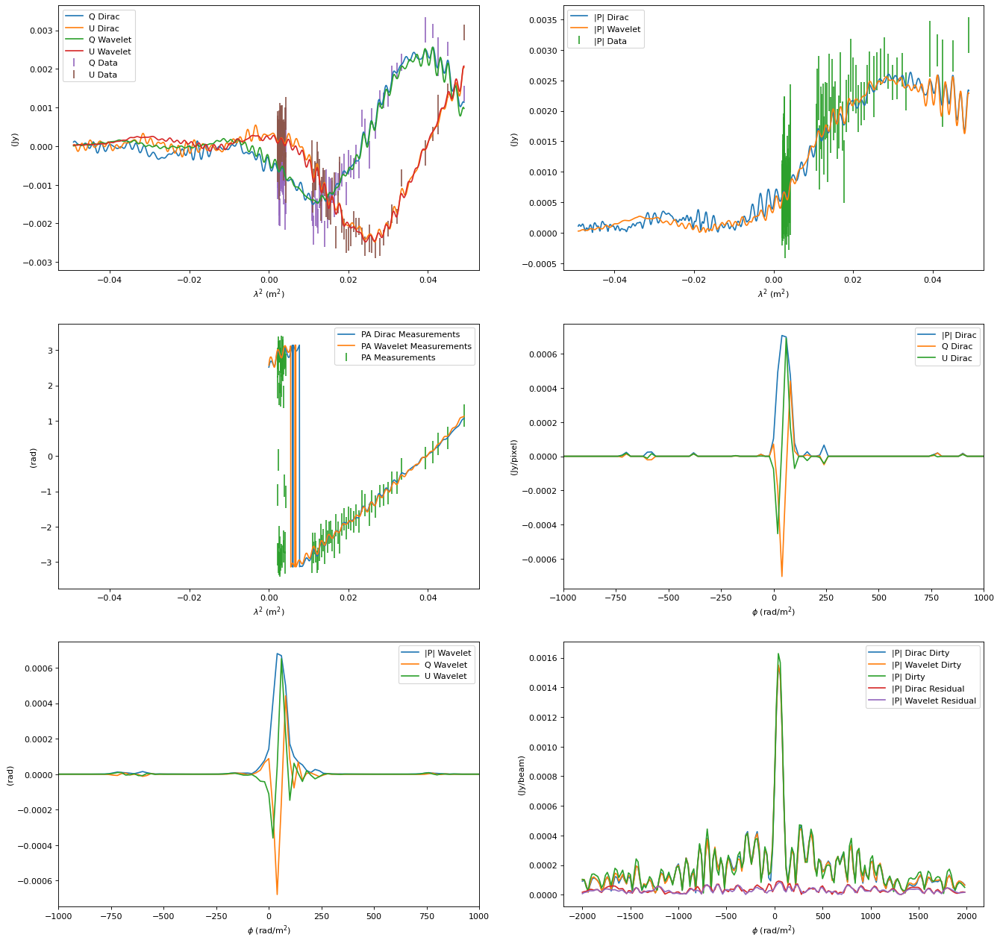

In [41]:
source = sources[35]
print(source)
wav = ['db4', "db6", "db8"]
levels = 1
sig_factor = 0.8
rm_max = 1000
rm_min = -1000
beta1, beta2 = 1e-3, 1e-3
test_source(source, wav, levels, sig_factor, rm_min, rm_max, beta1, beta2)